Cell: 1

In [3]:
!pip install timm segmentation-models-pytorch

Cell 2: Imports

In [2]:
import os
import time
from tqdm import tqdm
import torch.utils.data as data_utils
import glob
import random
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
import segmentation_models_pytorch as smp
from config import DATASET_PATH  # Assume config.py has DATASET_PATH = 'path/to/datasets'

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

c:\Asif\P3\Codes\.venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Using device: cuda


In [4]:
import torch
print(torch.__version__)            # Should print PyTorch version
print(torch.version.cuda)           # Should NOT be None
print(torch.cuda.is_available())    # Should be True
print(torch.cuda.get_device_name(0)) # Your GPU name

2.7.1+cu118
11.8
True
NVIDIA GeForce RTX 4070 Ti SUPER


Cell 3: Define Classes and Load Data
Python

In [5]:
# Cell 3: Define Classes and Load Data (updated glob)
# Fixed folder name mapping (now matches your actual folders)
CLASS_FOLDER_MAP = {
    0: "0_Microaneurysms_mask",
    1: "1_Hemorrhages_mask",
    2: "2_Exudates_mask",
    3: "3_CottonWoolSpots_mask",
    4: "4_Drusen_mask",           
    5: "5_Neovascularization_mask",
    6: "6_OpticDisc_mask"           
}
num_classes_total = 7

class_names = [
    "Microaneurysms",
    "Hemorrhages",
    "Exudates",
    "Cotton Wool Spots",
    "Drusen",
    "Neovascularization",
    "Optic Disc"
]

lesion_path = os.path.join(DATASET_PATH, 'Model A_lesion')
image_dir = os.path.join(lesion_path, 'original_images')

# Broad, case-insensitive extensions for all possible formats
image_paths = []
extensions = ['*.jpg', '*.JPG', '*.jpeg', '*.JPEG', '*.png', '*.PNG', '*.tif', '*.TIF']

for ext in extensions:
    image_paths.extend(glob.glob(os.path.join(image_dir, ext)))

# Remove duplicates if any (rare but safe)
image_paths = list(set(image_paths))

# After loading image_paths

print(f"Total images loaded: {len(image_paths)}")

idrid_paths = [p for p in image_paths if 'IDRiD' in os.path.basename(p)]
print(f"IDRiD-style images (case-sensitive 'IDRiD'): {len(idrid_paths)}")

idrid_upper_paths = [p for p in image_paths if 'IDRID' in os.path.basename(p).upper()]
print(f"IDRiD-style (upper case-insensitive): {len(idrid_upper_paths)}")

if idrid_upper_paths:
    print("\nFirst 5 detected IDRiD images:")
    for p in idrid_upper_paths[:5]:
        print("  ", os.path.basename(p))
else:
    print("\nNo IDRiD detected even case-insensitive → print first 10 files:")
    print([os.path.basename(p) for p in image_paths[:10]])

print(f"\nInferred MAPLeS-style (no 'IDRiD'): {len(image_paths) - len(idrid_upper_paths)}")

Total images loaded: 192
IDRiD-style images (case-sensitive 'IDRiD'): 54
IDRiD-style (upper case-insensitive): 54

First 5 detected IDRiD images:
   IDRiD_25.jpg
   IDRiD_08.jpg
   IDRiD_16.jpg
   IDRiD_32.jpg
   IDRiD_33.jpg

Inferred MAPLeS-style (no 'IDRiD'): 138


Cell 4: Load Masks Function (Updated for New Structure)

In [6]:
def load_masks(img_path, class_idx, target_size=(512, 512), verbose=1):
    img_base, _ = os.path.splitext(os.path.basename(img_path))
    is_idrid = 'IDRID' in img_base.upper()
    
    folder_name = CLASS_FOLDER_MAP.get(class_idx)
    if folder_name is None:
        return np.zeros(target_size, dtype=np.float32)
    
    mask_dir = os.path.join(lesion_path, folder_name)
    if not os.path.exists(mask_dir):
        return np.zeros(target_size, dtype=np.float32)
    
    exts = ['.tif', '.TIF', '.png', '.PNG', '.jpg', '.JPG']
    
    candidates = []
    
    for ext in exts:
        candidates.append(os.path.join(mask_dir, img_base + ext))
    
    if is_idrid:
        suffix_map = {0: '_MA', 1: '_HE', 2: '_EX', 3: '_SE', 6: '_OD'}
        suffix = suffix_map.get(class_idx, '')
        if suffix:
            for ext in ['.tif', '.TIF']:
                candidates.append(os.path.join(mask_dir, img_base + suffix + ext))
            for ext in ['.png', '.PNG', '.jpg', '.JPG']:
                candidates.append(os.path.join(mask_dir, img_base + suffix + ext))
    
    mask = np.zeros(target_size, dtype=np.float32)  # safe default
    
    for candidate in candidates:
        if os.path.exists(candidate):
            try:
                m = Image.open(candidate).convert('L')
                m_np_raw = np.array(m)
                
                thresh = 1 if is_idrid else 10  # lowered threshold
                m_np = (m_np_raw > thresh).astype(np.float32)
                
                m_pil = Image.fromarray((m_np * 255).astype(np.uint8))
                m_resized = m_pil.resize(target_size, Image.Resampling.NEAREST)
                mask = np.array(m_resized) / 255.0
                break
            except Exception:
                continue
    
    return mask

Cell 4.1 – EDA: Exploratory Data Analysis

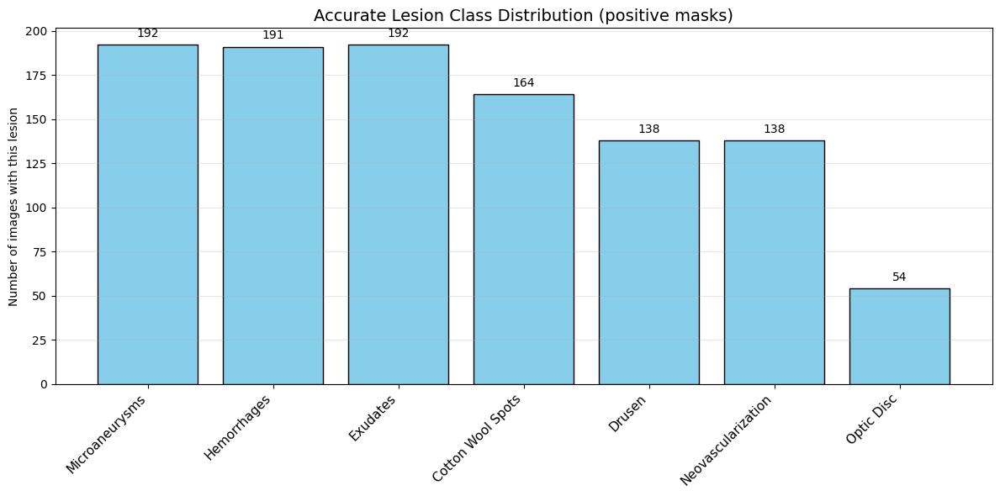


Correct positive instance counts:
   0 Microaneurysms            :  192 images
   1 Hemorrhages               :  191 images
   2 Exudates                  :  192 images
   3 Cotton Wool Spots         :  164 images
   4 Drusen                    :  138 images
   5 Neovascularization        :  138 images
   6 Optic Disc                :   54 images

Showing 2–3 sample images + corresponding masks per class:


Class 0: Microaneurysms  → 3 examples shown


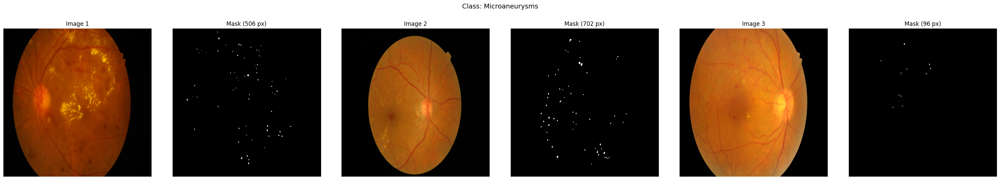


Class 1: Hemorrhages  → 3 examples shown


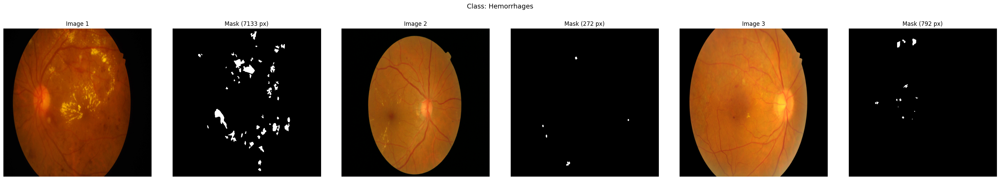


Class 2: Exudates  → 3 examples shown


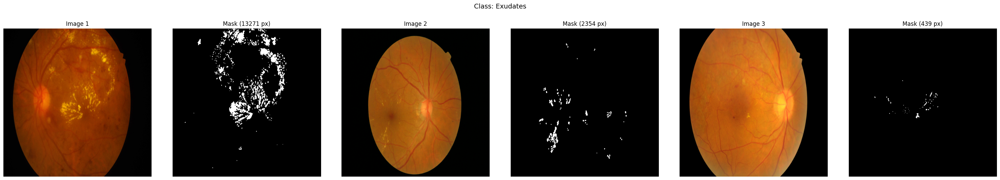


Class 3: Cotton Wool Spots  → 3 examples shown


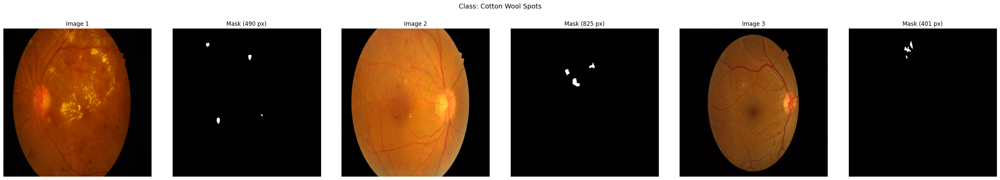


Class 4: Drusen  → 3 examples shown


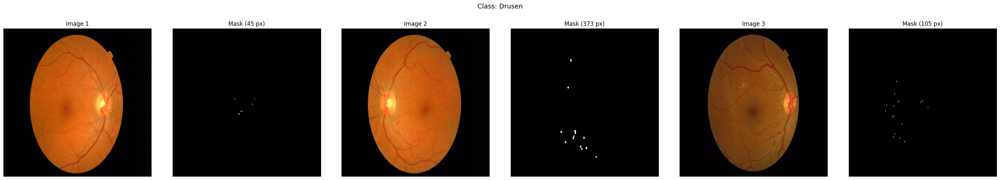


Class 5: Neovascularization  → 3 examples shown


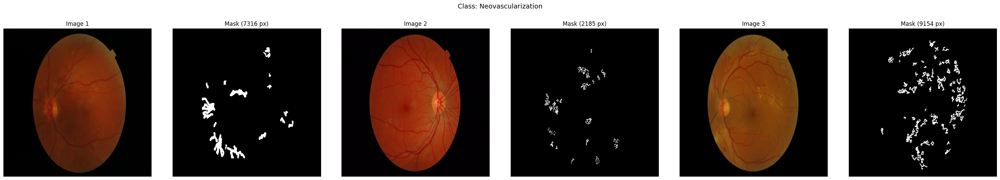


Class 6: Optic Disc  → 3 examples shown


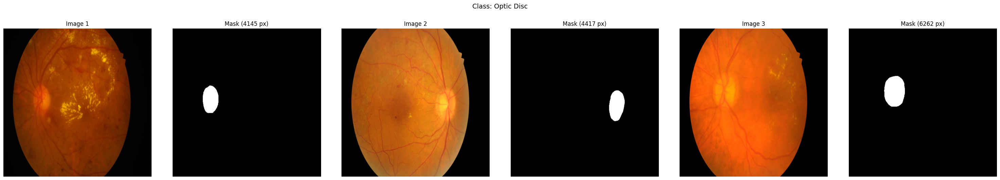

In [7]:
def count_positive_masks_per_class():
    positive_counts = np.zeros(num_classes_total, dtype=int)
    sample_images_per_class = {i: [] for i in range(num_classes_total)}
    
    for img_path in image_paths:
        img_base, _ = os.path.splitext(os.path.basename(img_path))
        is_idrid = 'IDRID' in img_base.upper()
        
        for cls in range(num_classes_total):
            folder_name = CLASS_FOLDER_MAP.get(cls)
            if folder_name is None:
                continue
            
            mask_dir = os.path.join(lesion_path, folder_name)
            if not os.path.exists(mask_dir):
                continue
            
            found = False
            candidates = []
            
            exts = ['.tif', '.TIF', '.png', '.PNG', '.jpg', '.JPG']
            
            # MAPLeS
            for ext in exts:
                candidates.append(os.path.join(mask_dir, img_base + ext))
            
            # IDRiD
            if is_idrid:
                suffix_map = {0: '_MA', 1: '_HE', 2: '_EX', 3: '_SE', 6: '_OD'}
                suffix = suffix_map.get(cls, '')
                if suffix:
                    for ext in ['.tif', '.TIF']:
                        candidates.append(os.path.join(mask_dir, img_base + suffix + ext))
                    for ext in ['.png', '.PNG', '.jpg', '.JPG']:
                        candidates.append(os.path.join(mask_dir, img_base + suffix + ext))
            
            for cand in candidates:
                if os.path.exists(cand):
                    found = True
                    break
            
            if found:
                positive_counts[cls] += 1
                if len(sample_images_per_class[cls]) < 3:
                    mask_np = load_masks(img_path, cls, target_size=(512, 512))
                    if (mask_np > 0).sum() > 10:
                        sample_images_per_class[cls].append((img_path, mask_np))
    
    return positive_counts, sample_images_per_class
# Run the accurate count
positive_counts, sample_images_per_class = count_positive_masks_per_class()

# ─── Plot distribution ───────────────────────────────────────────────────────
plt.figure(figsize=(12, 6))
bars = plt.bar(range(num_classes_total), positive_counts, color='skyblue', edgecolor='black')
plt.xticks(range(num_classes_total), class_names, rotation=45, ha='right', fontsize=11)
plt.ylabel("Number of images with this lesion")
plt.title("Accurate Lesion Class Distribution (positive masks)", fontsize=14)
plt.grid(axis='y', alpha=0.3)

for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 3, int(yval), ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()

print("\nCorrect positive instance counts:")
for i, name in enumerate(class_names):
    print(f"  {i:2d} {name:25} : {positive_counts[i]:4d} images")

# ─── Show 2–3 sample images + masks per class ───────────────────────────────
print("\nShowing 2–3 sample images + corresponding masks per class:\n")

for cls in range(num_classes_total):
    samples = sample_images_per_class[cls]
    if not samples:
        print(f"Class {cls} ({class_names[cls]}): No positive examples found")
        continue
    
    print(f"\nClass {cls}: {class_names[cls]}  → {len(samples)} examples shown")
    
    fig, axes = plt.subplots(1, len(samples)*2, figsize=(5*len(samples)*2, 5))
    fig.suptitle(f"Class: {class_names[cls]}", fontsize=14, y=1.05)
    
    for i, (img_path, mask_np) in enumerate(samples):
        orig = Image.open(img_path).convert('RGB')
        orig = np.array(orig.resize((512, 512), Image.Resampling.BILINEAR))
        
        axes[i*2].imshow(orig)
        axes[i*2].set_title(f"Image {i+1}")
        axes[i*2].axis('off')
        
        axes[i*2+1].imshow(mask_np, cmap='gray')
        axes[i*2+1].set_title(f"Mask ({(mask_np>0).sum()} px)")
        axes[i*2+1].axis('off')
    
    plt.tight_layout()
    plt.show()

In [8]:
positive_px = []
zero_count = 0

for i, p in enumerate(image_paths[:50]):  # check first 50 images
    m = load_masks(p, 0)  # class 0 = Microaneurysms
    pos = (m > 0).sum()
    positive_px.append(pos)
    if pos == 0:
        zero_count += 1
    if i % 10 == 0:
        print(f"Image {i}: {pos} positive pixels")

print(f"\nAverage positive pixels per image (first 50): {np.mean(positive_px):.1f}")
print(f"Images with ZERO positive pixels: {zero_count}/50 ({zero_count/50*100:.1f}%)")
print(f"Max positive pixels found: {max(positive_px)}")

Image 0: 506 positive pixels
Image 10: 46 positive pixels
Image 20: 0 positive pixels
Image 30: 247 positive pixels
Image 40: 88 positive pixels

Average positive pixels per image (first 50): 361.5
Images with ZERO positive pixels: 1/50 (2.0%)
Max positive pixels found: 1870


Cell 5: Dataset Class (Binary per Class)

In [9]:
class LesionDataset(Dataset):
    def __init__(self, image_paths, class_idx, transform=None, mask_transform=None):
        self.image_paths = image_paths
        self.class_idx = class_idx
        self.transform = transform
        self.mask_transform = mask_transform
    
    def __len__(self):
        return len(self.image_paths)
    
    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        
        # Load image
        img = Image.open(img_path).convert('RGB')
        img = img.resize((512, 512), Image.Resampling.BILINEAR)
        
        # Load mask (binary for this class)
        mask_np = load_masks(img_path, self.class_idx)
        mask = Image.fromarray((mask_np * 255).astype(np.uint8))
        
        if self.transform:
            img = self.transform(img)
        
        if self.mask_transform:
            mask = self.mask_transform(mask)
        
        return img, torch.tensor(mask_np).unsqueeze(0).float()  # (1, H, W)

Cell 6: Data Transforms (Improved Preprocessing)

In [10]:
# Training augmentations
train_transform = transforms.Compose([
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.5),
    transforms.RandomRotation(degrees=25),
    transforms.RandomAffine(degrees=0, translate=(0.1, 0.1), scale=(0.9, 1.1)),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.1, hue=0.05),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Validation / Test
val_test_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

mask_transform = transforms.Compose([
    transforms.ToTensor()  # converts PIL (0-255) → [0,1]
])

Cell 7: Loss Functions (Improved Options)

In [22]:
def get_loss(loss_type='dice_focal_tversky',
             gamma_focal=2.0,
             alpha_focal=0.75,
             t_alpha=0.7,
             t_beta=0.3,
             w_boundary=0.5):
    """
    Returns a loss function that expects RAW LOGITS as input.
    Internally applies sigmoid where needed.
    """

    dice = smp.losses.DiceLoss(mode='binary')  # works with logits or probs in 0.5.0

    if loss_type == 'dice_focal':
        focal = smp.losses.FocalLoss(mode='binary', gamma=gamma_focal, alpha=alpha_focal)
        return lambda p, t: dice(p, t) + focal(torch.sigmoid(p), t)

    elif loss_type == 'dice_tversky':
        tversky = smp.losses.TverskyLoss(mode='binary', alpha=t_alpha, beta=t_beta)
        return lambda p, t: dice(p, t) + tversky(torch.sigmoid(p), t)

    elif loss_type == 'dice_focal_tversky':
        focal   = smp.losses.FocalLoss(mode='binary', gamma=gamma_focal, alpha=alpha_focal)
        tversky = smp.losses.TverskyLoss(mode='binary', alpha=t_alpha, beta=t_beta)
        return lambda p, t: dice(p, t) + 0.8 * focal(torch.sigmoid(p), t) + 0.8 * tversky(torch.sigmoid(p), t)

    elif loss_type == 'dice_boundary':
        def boundary_loss(p, t):
            p_prob = torch.sigmoid(p)
            gx_p = torch.abs(p_prob[:, :, :, 1:] - p_prob[:, :, :, :-1])
            gy_p = torch.abs(p_prob[:, :, 1:, :] - p_prob[:, :, :-1, :])
            gx_t = torch.abs(t[:, :, :, 1:] - t[:, :, :, :-1])
            gy_t = torch.abs(t[:, :, 1:, :] - t[:, :, :-1, :])
            return torch.mean(torch.abs(gx_p - gx_t)) + torch.mean(torch.abs(gy_p - gy_t))
        return lambda p, t: dice(p, t) + w_boundary * boundary_loss(p, t)

    else:
        raise ValueError(f"Unknown loss_type: {loss_type}")

Cell 8: Training Function with Checkpointing

In [12]:
from monai.networks.nets import SwinUNETR

In [26]:
def train_model_for_class(class_idx, epochs=200, batch_size=8, lr=1e-4,
                          loss_type='dice_focal_tversky', patience_early=18, patience_plateau=7, min_lr=1e-6):
    """
    Train a binary segmentation model for one lesion class.
    Returns model, test_dataset, test_loader
    """
    print(f"\nTraining class {class_idx}: {class_names[class_idx]} | loss={loss_type}")

    checkpoint_dir = f"checkpoints_class_{class_idx}"
    os.makedirs(checkpoint_dir, exist_ok=True)
    
    latest_ckpt  = os.path.join(checkpoint_dir, "latest.pth")
    best_ckpt    = os.path.join(checkpoint_dir, "best.pth")  # separate best file
    
    # Data split
    train_p, temp_p = train_test_split(image_paths, test_size=0.3, random_state=42)
    val_p, test_p   = train_test_split(temp_p,   test_size=0.5, random_state=42)

    train_ds = LesionDataset(train_p, class_idx, train_transform, mask_transform)
    val_ds   = LesionDataset(val_p,   class_idx, val_test_transform, mask_transform)
    test_ds  = LesionDataset(test_p,  class_idx, val_test_transform, mask_transform)

    # Weighted sampler
    pos_weights = []
    print("Computing positive sample weights...", end=" ")
    for p in train_p:
        m = load_masks(p, class_idx)
        pos_frac = (m > 0.01).mean()
        weight = max(1.0, 4.0 + 25.0 * pos_frac)
        pos_weights.append(weight)
    print("done.")

    sampler = data_utils.WeightedRandomSampler(weights=pos_weights, num_samples=len(pos_weights), replacement=True)

    train_loader = DataLoader(
        train_ds, 
        batch_size=batch_size, 
        sampler=sampler, 
        num_workers=0, 
        pin_memory=True
    )
    
    val_loader   = DataLoader(
        val_ds,   
        batch_size=batch_size, 
        num_workers=0, 
        pin_memory=True
    )

    # Model
    model = SwinUNETR(
        in_channels=3,
        out_channels=1,
        feature_size=48,
        use_checkpoint=True,
        spatial_dims=2,
    ).to(device)

    # Apply initial bias for tiny/rare lesions
    if class_idx in [0, 4, 5]:
        with torch.no_grad():
            last_conv = None
            for module in reversed(list(model.modules())):
                if isinstance(module, torch.nn.Conv2d) and module.bias is not None:
                    last_conv = module
                    break
            
            if last_conv is not None:
                last_conv.bias.fill_(-3.5)
                print(f"Applied initial bias = -3.5 to final conv layer (for tiny lesions)")
            else:
                print(f"Warning: No final conv layer with bias found in SwinUNETR")

    optimizer = optim.AdamW(model.parameters(), lr=lr, weight_decay=1e-5)
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', factor=0.5, patience=patience_plateau, min_lr=min_lr)

    criterion = get_loss(loss_type)

    # ────────────────────────────────────────────────────────────────
    # Dice coefficient function (defined here so no NameError)
    # ────────────────────────────────────────────────────────────────
    def dice_coeff(pred, target, eps=1e-6, threshold=0.5):
        pred_prob = torch.sigmoid(pred) if pred.max() > 1.0 or pred.min() < 0.0 else pred
        pred_bin = (pred_prob > threshold).float()
        inter = (pred_bin * target).sum()
        union = pred_bin.sum() + target.sum()
        return (2. * inter + eps) / (union + eps + 1e-8)

    # Load checkpoint
    start_epoch = 0
    best_val_dice = 0.0
    train_losses, val_losses, train_dices, val_dices = [], [], [], []
    epochs_no_improve = 0

    if os.path.exists(latest_ckpt):
        ckpt = torch.load(latest_ckpt, map_location=device)
        model.load_state_dict(ckpt['model_state_dict'])
        optimizer.load_state_dict(ckpt['optimizer_state_dict'])
        start_epoch = ckpt['epoch'] + 1
        best_val_dice = ckpt.get('best_val_dice', 0.0)
        train_losses = ckpt.get('train_losses', [])
        val_losses   = ckpt.get('val_losses', [])
        train_dices  = ckpt.get('train_dices', [])
        val_dices    = ckpt.get('val_dices', [])
        epochs_no_improve = ckpt.get('epochs_no_improve', 0)
        print(f"Resumed from epoch {start_epoch}/{epochs} (best dice: {best_val_dice:.4f})")
    else:
        print("Starting from scratch — no checkpoint found")

    # Training loop
    for epoch in range(start_epoch, epochs):
        model.train()
        train_loss = train_dice_sum = 0.0
        pbar = tqdm(train_loader, desc=f"[{epoch+1:3d}/{epochs}] Train", leave=False)

        for images, masks in pbar:
            images, masks = images.to(device), masks.to(device)
            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, masks)
            loss.backward()
            optimizer.step()

            b_loss = loss.item()
            b_dice = dice_coeff(outputs, masks).mean().item()

            train_loss += b_loss
            train_dice_sum += b_dice
            pbar.set_postfix(Loss=f"{b_loss:.4f}", Dice=f"{b_dice:.4f}")

        avg_train_loss = train_loss / len(train_loader) if train_loader else 0.0
        avg_train_dice = train_dice_sum / len(train_loader) if train_loader else 0.0

        # Validation
        model.eval()
        val_loss = val_dice_sum = 0.0
        with torch.no_grad():
            for images, masks in val_loader:
                images, masks = images.to(device), masks.to(device)
                outputs = model(images)
                loss = criterion(outputs, masks)
                val_loss += loss.item()
                val_dice_sum += dice_coeff(outputs, masks).mean().item()

        avg_val_loss = val_loss / len(val_loader) if val_loader else 0.0
        avg_val_dice = val_dice_sum / len(val_loader) if val_loader else 0.0

        scheduler.step(avg_val_dice)

        print(f"[{epoch+1:3d}/{epochs}]  Train loss: {avg_train_loss:.4f} dice: {avg_train_dice:.4f}   "
              f"|  Val loss: {avg_val_loss:.4f} dice: {avg_val_dice:.4f}")

        # Save latest checkpoint
        torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'best_val_dice': best_val_dice,
            'train_losses': train_losses + [avg_train_loss],
            'val_losses': val_losses + [avg_val_loss],
            'train_dices': train_dices + [avg_train_dice],
            'val_dices': val_dices + [avg_val_dice],
            'epochs_no_improve': epochs_no_improve,
        }, latest_ckpt)

        # Save best if improved
        if avg_val_dice > best_val_dice:
            best_val_dice = avg_val_dice
            torch.save(model.state_dict(), best_ckpt)
            print(f"   → New best saved (val dice: {best_val_dice:.4f})")
            epochs_no_improve = 0
        else:
            epochs_no_improve += 1
            print(f"   No improvement for {epochs_no_improve}/{patience_early} epochs")
            if epochs_no_improve >= patience_early:
                print(f"Early stopping at epoch {epoch+1}")
                break

    print(f"Training completed for class {class_idx}. Best val Dice: {best_val_dice:.4f}")

    # ────────────────────────────────────────────────────────────────
    # Plot learning curves – now guaranteed to show in notebook
    # ────────────────────────────────────────────────────────────────
    if train_losses:  # only plot if we have data
        fig, ax = plt.subplots(1, 2, figsize=(14, 6))
        
        ax[0].plot(train_losses, label='Train Loss', color='blue')
        ax[0].plot(val_losses, label='Val Loss', color='orange')
        ax[0].set_title('Loss Curves')
        ax[0].set_xlabel('Epoch')
        ax[0].set_ylabel('Loss')
        ax[0].legend()
        ax[0].grid(True, alpha=0.3)

        ax[1].plot(train_dices, label='Train Dice', color='blue')
        ax[1].plot(val_dices, label='Val Dice', color='orange')
        ax[1].set_title('Dice Curves')
        ax[1].set_xlabel('Epoch')
        ax[1].set_ylabel('Dice')
        ax[1].legend()
        ax[1].grid(True, alpha=0.3)

        fig.suptitle(f'Learning Curves – Class {class_idx}: {class_names[class_idx]}', fontsize=16, y=1.02)
        plt.tight_layout()

        # Save to disk
        plt.savefig(os.path.join(checkpoint_dir, f"curves_class_{class_idx}.png"), dpi=200, bbox_inches='tight')

        # Show in notebook output
        plt.show()

        # Close figure to free memory
        plt.close(fig)
    else:
        print("No training data recorded → no curve plotted")

    # Final test loader
    test_loader = DataLoader(
        test_ds,
        batch_size=8,
        shuffle=False,
        num_workers=0,
        pin_memory=True
    )

    return model, test_ds, test_loader

Cell 9: Evaluation & Visualization (per class)

In [23]:
@torch.no_grad()
def evaluate_class_model(class_idx, model, test_loader):
    model.eval()
    all_pred = []
    all_gt = []

    thresh = 0.7 if class_idx == 6 else (0.20 if class_idx in [4,5] else 0.35)  # lower for rare/tiny classes

    for images, masks in test_loader:
        images = images.to(device)
        outputs = torch.sigmoid(model(images)).cpu()
        preds_bin = (outputs > thresh).float()
        all_pred.append(preds_bin)
        all_gt.append(masks)

    all_pred = torch.cat(all_pred)
    all_gt = torch.cat(all_gt)

    dice = dice_coeff(all_pred, all_gt).item()
    iou = (all_pred * all_gt).sum() / ((all_pred + all_gt) > 0).sum().clamp(min=1e-6).item()

    print(f"\nClass {class_idx} – {class_names[class_idx]}")
    print(f"  Mean Dice: {dice:.4f}")
    print(f"  Mean IoU: {iou:.4f}")

    # Visualization – 4 samples
    n_show = min(4, len(test_loader.dataset))
    idxs = random.sample(range(len(test_loader.dataset)), n_show)

    fig, axes = plt.subplots(n_show, 3, figsize=(9, 3*n_show))
    fig.suptitle(f"Evaluation for Class {class_names[class_idx]}", fontsize=16)

    for i, idx in enumerate(idxs):
        img, gt = test_loader.dataset[idx]
        img_denorm = img.permute(1,2,0).numpy() * np.array([0.229,0.224,0.225]) + np.array([0.485,0.456,0.406])
        img_denorm = np.clip(img_denorm, 0, 1)

        with torch.no_grad():
            pred_prob = torch.sigmoid(model(img.unsqueeze(0).to(device))).cpu().squeeze().numpy()
            pred_bin = (pred_prob > thresh)

        axes[i,0].imshow(img_denorm); axes[i,0].set_title("Image"); axes[i,0].axis('off')
        axes[i,1].imshow(gt.squeeze(), cmap='gray'); axes[i,1].set_title("GT"); axes[i,1].axis('off')
        axes[i,2].imshow(pred_bin, cmap='gray'); axes[i,2].set_title(f"Pred (Dice {dice:.3f})"); axes[i,2].axis('off')

    plt.tight_layout()
    plt.savefig(f"examples_class_{class_idx}.png", dpi=150)
    plt.show()

Cell 10: Main Training Loop – One class at a time


══════════════════════════════════════════════════════════════════════════════════════════
STARTING TRAINING → Class 0 : MICROANEURYSMS
Loss type: Focal | Epochs max: 120 | Batch: 8
══════════════════════════════════════════════════════════════════════════════════════════


Training class 0: Microaneurysms | loss=dice_focal_tversky
Computing positive sample weights for training set... done.
Resumed from epoch 76 (best dice: 0.0139)


[ 77/120]  Train loss: 0.9990 dice: 0.0131   |  Val loss: 0.9993 dice: 0.0128
   No improvement for 1/18 epochs


[ 78/120]  Train loss: 0.9985 dice: 0.0183   |  Val loss: 0.9993 dice: 0.0158
   → New best saved (val dice: 0.0158)


[ 79/120]  Train loss: 0.9987 dice: 0.0160   |  Val loss: 0.9993 dice: 0.0183
   → New best saved (val dice: 0.0183)


[ 80/120]  Train loss: 0.9987 dice: 0.0223   |  Val loss: 0.9993 dice: 0.0165
   No improvement for 1/18 epochs


[ 81/120]  Train loss: 0.9990 dice: 0.0193   |  Val loss: 0.9993 dice: 0.0111
   No improvement for 2/18 epochs


[ 82/120]  Train loss: 0.9988 dice: 0.0165   |  Val loss: 0.9993 dice: 0.0149
   No improvement for 3/18 epochs


[ 83/120]  Train loss: 0.9981 dice: 0.0298   |  Val loss: 0.9993 dice: 0.0190
   → New best saved (val dice: 0.0190)


[ 84/120]  Train loss: 0.9991 dice: 0.0203   |  Val loss: 0.9993 dice: 0.0134
   No improvement for 1/18 epochs


[ 85/120]  Train loss: 0.9987 dice: 0.0207   |  Val loss: 0.9993 dice: 0.0175
   No improvement for 2/18 epochs


[ 86/120]  Train loss: 0.9982 dice: 0.0324   |  Val loss: 0.9993 dice: 0.0191
   → New best saved (val dice: 0.0191)


[ 87/120]  Train loss: 0.9977 dice: 0.0317   |  Val loss: 0.9994 dice: 0.0221
   → New best saved (val dice: 0.0221)


[ 88/120]  Train loss: 0.9983 dice: 0.0211   |  Val loss: 0.9994 dice: 0.0230
   → New best saved (val dice: 0.0230)


[ 89/120]  Train loss: 0.9981 dice: 0.0355   |  Val loss: 0.9994 dice: 0.0230
   No improvement for 1/18 epochs


[ 90/120]  Train loss: 0.9977 dice: 0.0345   |  Val loss: 0.9995 dice: 0.0241
   → New best saved (val dice: 0.0241)


[ 91/120]  Train loss: 0.9981 dice: 0.0452   |  Val loss: 0.9994 dice: 0.0198
   No improvement for 1/18 epochs


[ 92/120]  Train loss: 0.9990 dice: 0.0261   |  Val loss: 0.9994 dice: 0.0210
   No improvement for 2/18 epochs


[ 93/120]  Train loss: 0.9981 dice: 0.0461   |  Val loss: 0.9995 dice: 0.0248
   → New best saved (val dice: 0.0248)


[ 94/120]  Train loss: 0.9975 dice: 0.0541   |  Val loss: 0.9994 dice: 0.0267
   → New best saved (val dice: 0.0267)


[ 95/120]  Train loss: 0.9974 dice: 0.0527   |  Val loss: 0.9995 dice: 0.0290
   → New best saved (val dice: 0.0290)


[ 96/120]  Train loss: 0.9976 dice: 0.0401   |  Val loss: 0.9995 dice: 0.0272
   No improvement for 1/18 epochs


[ 97/120]  Train loss: 0.9971 dice: 0.0424   |  Val loss: 0.9996 dice: 0.0239
   No improvement for 2/18 epochs


[ 98/120]  Train loss: 0.9982 dice: 0.0466   |  Val loss: 0.9995 dice: 0.0196
   No improvement for 3/18 epochs


[ 99/120]  Train loss: 0.9972 dice: 0.0488   |  Val loss: 0.9995 dice: 0.0283
   No improvement for 4/18 epochs


[100/120]  Train loss: 0.9972 dice: 0.0631   |  Val loss: 0.9995 dice: 0.0281
   No improvement for 5/18 epochs


[101/120]  Train loss: 0.9979 dice: 0.0356   |  Val loss: 0.9995 dice: 0.0257
   No improvement for 6/18 epochs


[102/120]  Train loss: 0.9980 dice: 0.0518   |  Val loss: 0.9994 dice: 0.0275
   No improvement for 7/18 epochs


[103/120]  Train loss: 0.9973 dice: 0.0730   |  Val loss: 0.9995 dice: 0.0283
   No improvement for 8/18 epochs


[104/120]  Train loss: 0.9973 dice: 0.0548   |  Val loss: 0.9995 dice: 0.0291
   → New best saved (val dice: 0.0291)


[105/120]  Train loss: 0.9979 dice: 0.0572   |  Val loss: 0.9995 dice: 0.0276
   No improvement for 1/18 epochs


[106/120]  Train loss: 0.9984 dice: 0.0433   |  Val loss: 0.9994 dice: 0.0272
   No improvement for 2/18 epochs


[107/120]  Train loss: 0.9980 dice: 0.0416   |  Val loss: 0.9995 dice: 0.0286
   No improvement for 3/18 epochs


[108/120]  Train loss: 0.9964 dice: 0.0739   |  Val loss: 0.9995 dice: 0.0295
   → New best saved (val dice: 0.0295)


[109/120]  Train loss: 0.9974 dice: 0.0544   |  Val loss: 0.9996 dice: 0.0295
   No improvement for 1/18 epochs


[110/120]  Train loss: 0.9976 dice: 0.0564   |  Val loss: 0.9995 dice: 0.0280
   No improvement for 2/18 epochs


[111/120]  Train loss: 0.9977 dice: 0.0814   |  Val loss: 0.9995 dice: 0.0288
   No improvement for 3/18 epochs


[112/120]  Train loss: 0.9969 dice: 0.0653   |  Val loss: 0.9996 dice: 0.0290
   No improvement for 4/18 epochs


[113/120]  Train loss: 0.9978 dice: 0.0585   |  Val loss: 0.9995 dice: 0.0307
   → New best saved (val dice: 0.0307)


[114/120]  Train loss: 0.9967 dice: 0.0615   |  Val loss: 0.9996 dice: 0.0304
   No improvement for 1/18 epochs


[115/120]  Train loss: 0.9978 dice: 0.0451   |  Val loss: 0.9995 dice: 0.0279
   No improvement for 2/18 epochs


[116/120]  Train loss: 0.9977 dice: 0.0517   |  Val loss: 0.9995 dice: 0.0290
   No improvement for 3/18 epochs


[117/120]  Train loss: 0.9975 dice: 0.0651   |  Val loss: 0.9995 dice: 0.0283
   No improvement for 4/18 epochs


[118/120]  Train loss: 0.9969 dice: 0.0678   |  Val loss: 0.9996 dice: 0.0271
   No improvement for 5/18 epochs


[119/120]  Train loss: 0.9973 dice: 0.0522   |  Val loss: 0.9996 dice: 0.0252
   No improvement for 6/18 epochs


[120/120]  Train loss: 0.9969 dice: 0.0586   |  Val loss: 0.9995 dice: 0.0234
   No improvement for 7/18 epochs
Training completed for class 0. Best val Dice: 0.0307

Class 0 training finished in 15.3 minutes


Class 0 – Microaneurysms
  Mean Dice: 0.0242
  Mean IoU: 0.0122


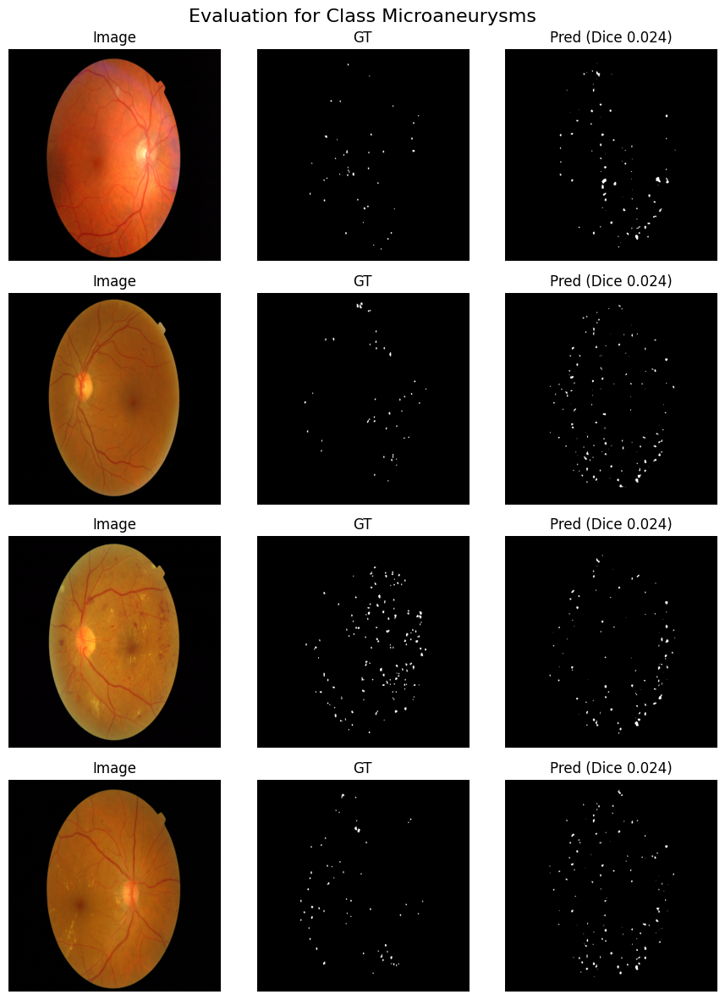


──────────────────────────────────────────────────────────────────────────────────────────


══════════════════════════════════════════════════════════════════════════════════════════
STARTING TRAINING → Class 1 : HEMORRHAGES
Loss type: Focal | Epochs max: 120 | Batch: 8
══════════════════════════════════════════════════════════════════════════════════════════


Training class 1: Hemorrhages | loss=dice_focal_tversky
Computing positive sample weights for training set... done.


[  1/120]  Train loss: 1.0506 dice: 0.0057   |  Val loss: 1.0221 dice: 0.0005
   → New best saved (val dice: 0.0005)


[  2/120]  Train loss: 1.0127 dice: 0.0009   |  Val loss: 1.0094 dice: 0.0001
   No improvement for 1/18 epochs


[  3/120]  Train loss: 0.9975 dice: 0.0002   |  Val loss: 1.0060 dice: 0.0000
   No improvement for 2/18 epochs


[  4/120]  Train loss: 0.9984 dice: 0.0000   |  Val loss: 1.0041 dice: 0.0000
   No improvement for 3/18 epochs


[  5/120]  Train loss: 1.0004 dice: 0.0000   |  Val loss: 1.0030 dice: 0.0000
   No improvement for 4/18 epochs


[  6/120]  Train loss: 0.9988 dice: 0.0000   |  Val loss: 1.0022 dice: 0.0000
   No improvement for 5/18 epochs


[  7/120]  Train loss: 0.9966 dice: 0.0000   |  Val loss: 1.0015 dice: 0.0000
   No improvement for 6/18 epochs


[  8/120]  Train loss: 0.9955 dice: 0.0000   |  Val loss: 1.0017 dice: 0.0000
   No improvement for 7/18 epochs


[  9/120]  Train loss: 1.0011 dice: 0.0000   |  Val loss: 1.0010 dice: 0.0000
   No improvement for 8/18 epochs


[ 10/120]  Train loss: 0.9906 dice: 0.0000   |  Val loss: 1.0005 dice: 0.0000
   No improvement for 9/18 epochs


[ 11/120]  Train loss: 0.9952 dice: 0.0000   |  Val loss: 1.0004 dice: 0.0000
   No improvement for 10/18 epochs


[ 12/120]  Train loss: 0.9983 dice: 0.0000   |  Val loss: 1.0003 dice: 0.0000
   No improvement for 11/18 epochs


[ 13/120]  Train loss: 0.9956 dice: 0.0000   |  Val loss: 1.0002 dice: 0.0000
   No improvement for 12/18 epochs


[ 14/120]  Train loss: 0.9906 dice: 0.0000   |  Val loss: 1.0002 dice: 0.0000
   No improvement for 13/18 epochs


[ 15/120]  Train loss: 0.9925 dice: 0.0000   |  Val loss: 1.0004 dice: 0.0000
   No improvement for 14/18 epochs


[ 16/120]  Train loss: 0.9994 dice: 0.0000   |  Val loss: 0.9995 dice: 0.0000
   No improvement for 15/18 epochs


[ 17/120]  Train loss: 0.9910 dice: 0.0000   |  Val loss: 0.9992 dice: 0.0000
   No improvement for 16/18 epochs


[ 18/120]  Train loss: 0.9959 dice: 0.0000   |  Val loss: 0.9993 dice: 0.0000
   No improvement for 17/18 epochs


[ 19/120]  Train loss: 0.9973 dice: 0.0000   |  Val loss: 0.9993 dice: 0.0000
   No improvement for 18/18 epochs
Early stopping at epoch 19
Training completed for class 1. Best val Dice: 0.0005

Class 1 training finished in 6.7 minutes


Class 1 – Hemorrhages
  Mean Dice: 0.0306
  Mean IoU: 0.0156


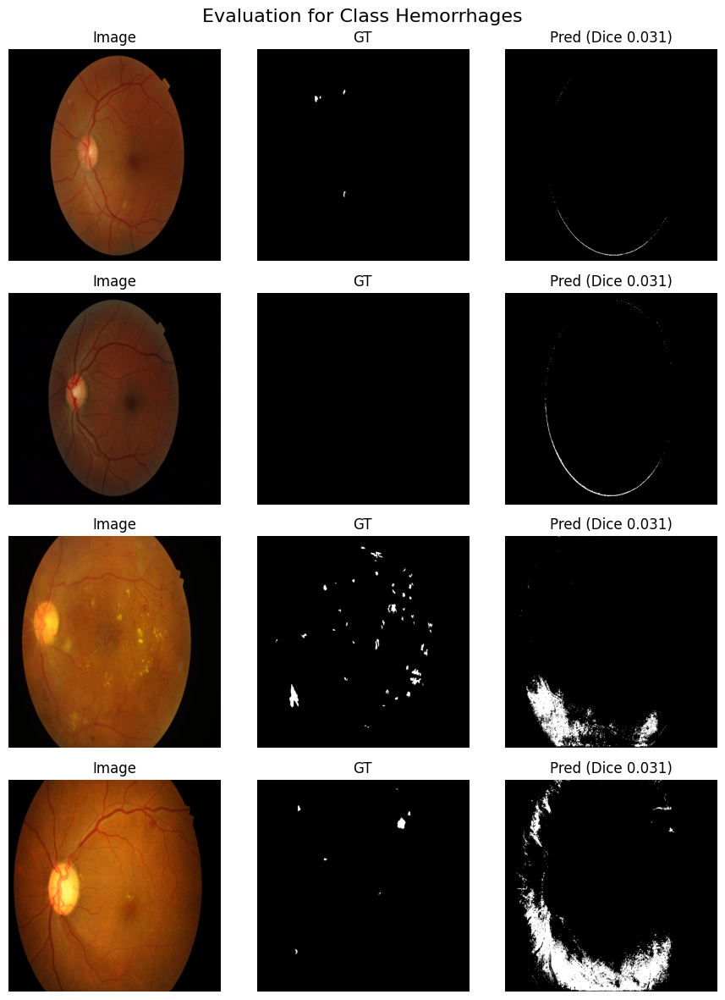


──────────────────────────────────────────────────────────────────────────────────────────


══════════════════════════════════════════════════════════════════════════════════════════
STARTING TRAINING → Class 2 : EXUDATES
Loss type: Focal | Epochs max: 120 | Batch: 8
══════════════════════════════════════════════════════════════════════════════════════════


Training class 2: Exudates | loss=dice_focal_tversky
Computing positive sample weights for training set... done.


[  1/120]  Train loss: 1.0481 dice: 0.0035   |  Val loss: 1.0150 dice: 0.0006
   → New best saved (val dice: 0.0006)


[  2/120]  Train loss: 1.0076 dice: 0.0006   |  Val loss: 1.0043 dice: 0.0000
   No improvement for 1/18 epochs


[  3/120]  Train loss: 1.0004 dice: 0.0009   |  Val loss: 1.0016 dice: 0.0000
   No improvement for 2/18 epochs


[  4/120]  Train loss: 1.0004 dice: 0.0000   |  Val loss: 1.0001 dice: 0.0000
   No improvement for 3/18 epochs


[  5/120]  Train loss: 0.9979 dice: 0.0000   |  Val loss: 0.9995 dice: 0.0000
   No improvement for 4/18 epochs


[  6/120]  Train loss: 0.9996 dice: 0.0000   |  Val loss: 0.9987 dice: 0.0000
   No improvement for 5/18 epochs


[  7/120]  Train loss: 0.9998 dice: 0.0000   |  Val loss: 0.9983 dice: 0.0000
   No improvement for 6/18 epochs


[  8/120]  Train loss: 0.9981 dice: 0.0000   |  Val loss: 0.9979 dice: 0.0000
   No improvement for 7/18 epochs


[  9/120]  Train loss: 0.9975 dice: 0.0000   |  Val loss: 0.9977 dice: 0.0000
   No improvement for 8/18 epochs


[ 10/120]  Train loss: 0.9980 dice: 0.0000   |  Val loss: 0.9976 dice: 0.0000
   No improvement for 9/18 epochs


[ 11/120]  Train loss: 0.9981 dice: 0.0000   |  Val loss: 0.9973 dice: 0.0000
   No improvement for 10/18 epochs


[ 12/120]  Train loss: 0.9957 dice: 0.0000   |  Val loss: 0.9974 dice: 0.0000
   No improvement for 11/18 epochs


[ 13/120]  Train loss: 0.9975 dice: 0.0000   |  Val loss: 0.9971 dice: 0.0000
   No improvement for 12/18 epochs


[ 14/120]  Train loss: 0.9958 dice: 0.0000   |  Val loss: 0.9969 dice: 0.0000
   No improvement for 13/18 epochs


[ 15/120]  Train loss: 0.9945 dice: 0.0000   |  Val loss: 0.9966 dice: 0.0000
   No improvement for 14/18 epochs


[ 16/120]  Train loss: 0.9961 dice: 0.0000   |  Val loss: 0.9966 dice: 0.0000
   No improvement for 15/18 epochs


[ 17/120]  Train loss: 0.9954 dice: 0.0000   |  Val loss: 0.9963 dice: 0.0000
   No improvement for 16/18 epochs


[ 18/120]  Train loss: 0.9933 dice: 0.0000   |  Val loss: 0.9972 dice: 0.0000
   No improvement for 17/18 epochs


[ 19/120]  Train loss: 0.9932 dice: 0.0000   |  Val loss: 0.9968 dice: 0.0000
   No improvement for 18/18 epochs
Early stopping at epoch 19
Training completed for class 2. Best val Dice: 0.0006

Class 2 training finished in 6.8 minutes


Class 2 – Exudates
  Mean Dice: 0.0985
  Mean IoU: 0.0518


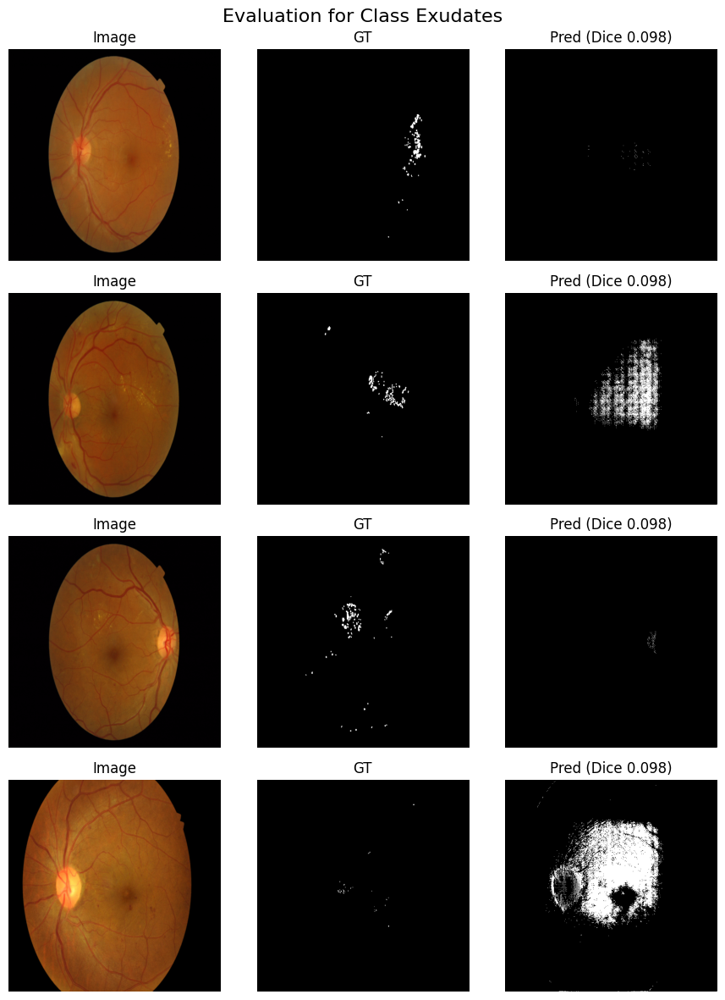


──────────────────────────────────────────────────────────────────────────────────────────


══════════════════════════════════════════════════════════════════════════════════════════
STARTING TRAINING → Class 3 : COTTON WOOL SPOTS
Loss type: Focal | Epochs max: 120 | Batch: 8
══════════════════════════════════════════════════════════════════════════════════════════


Training class 3: Cotton Wool Spots | loss=dice_focal_tversky
Computing positive sample weights for training set... done.


[  1/120]  Train loss: 0.9711 dice: 0.0011   |  Val loss: 1.0085 dice: 0.0000
   → New best saved (val dice: 0.0000)


[  2/120]  Train loss: 1.0047 dice: 0.0000   |  Val loss: 1.0035 dice: 0.0000
   → New best saved (val dice: 0.0000)


[  3/120]  Train loss: 1.0026 dice: 0.0000   |  Val loss: 1.0021 dice: 0.0000
   → New best saved (val dice: 0.0000)


[  4/120]  Train loss: 1.0015 dice: 0.0000   |  Val loss: 1.0015 dice: 0.0000
   No improvement for 1/18 epochs


[  5/120]  Train loss: 1.0014 dice: 0.0000   |  Val loss: 1.0012 dice: 0.0000
   No improvement for 2/18 epochs


[  6/120]  Train loss: 0.9417 dice: 0.0588   |  Val loss: 1.0010 dice: 0.0000
   No improvement for 3/18 epochs


[  7/120]  Train loss: 0.9417 dice: 0.0588   |  Val loss: 1.0008 dice: 0.0000
   No improvement for 4/18 epochs


[  8/120]  Train loss: 1.0001 dice: 0.0000   |  Val loss: 1.0006 dice: 0.0000
   No improvement for 5/18 epochs


[  9/120]  Train loss: 1.0005 dice: 0.0000   |  Val loss: 1.0005 dice: 0.0000
   No improvement for 6/18 epochs


[ 10/120]  Train loss: 0.9410 dice: 0.0588   |  Val loss: 1.0005 dice: 0.0000
   No improvement for 7/18 epochs


[ 11/120]  Train loss: 0.9414 dice: 0.0588   |  Val loss: 1.0004 dice: 0.0000
   No improvement for 8/18 epochs


[ 12/120]  Train loss: 1.0003 dice: 0.0000   |  Val loss: 1.0004 dice: 0.0000
   No improvement for 9/18 epochs


[ 13/120]  Train loss: 1.0001 dice: 0.0000   |  Val loss: 1.0003 dice: 0.0000
   No improvement for 10/18 epochs


[ 14/120]  Train loss: 0.9999 dice: 0.0000   |  Val loss: 1.0003 dice: 0.0000
   No improvement for 11/18 epochs


[ 15/120]  Train loss: 0.9408 dice: 0.0588   |  Val loss: 1.0002 dice: 0.0000
   No improvement for 12/18 epochs


[ 16/120]  Train loss: 0.9411 dice: 0.0588   |  Val loss: 1.0002 dice: 0.0000
   No improvement for 13/18 epochs


[ 17/120]  Train loss: 0.9413 dice: 0.0588   |  Val loss: 1.0002 dice: 0.0000
   No improvement for 14/18 epochs


[ 18/120]  Train loss: 0.9409 dice: 0.0588   |  Val loss: 1.0001 dice: 0.0000
   No improvement for 15/18 epochs


[ 19/120]  Train loss: 0.9412 dice: 0.0588   |  Val loss: 1.0001 dice: 0.0000
   No improvement for 16/18 epochs


[ 20/120]  Train loss: 0.9999 dice: 0.0000   |  Val loss: 1.0001 dice: 0.0000
   No improvement for 17/18 epochs


[ 21/120]  Train loss: 1.0000 dice: 0.0000   |  Val loss: 1.0001 dice: 0.0000
   No improvement for 18/18 epochs
Early stopping at epoch 21
Training completed for class 3. Best val Dice: 0.0000

Class 3 training finished in 7.1 minutes


Class 3 – Cotton Wool Spots
  Mean Dice: 0.0000
  Mean IoU: 0.0000


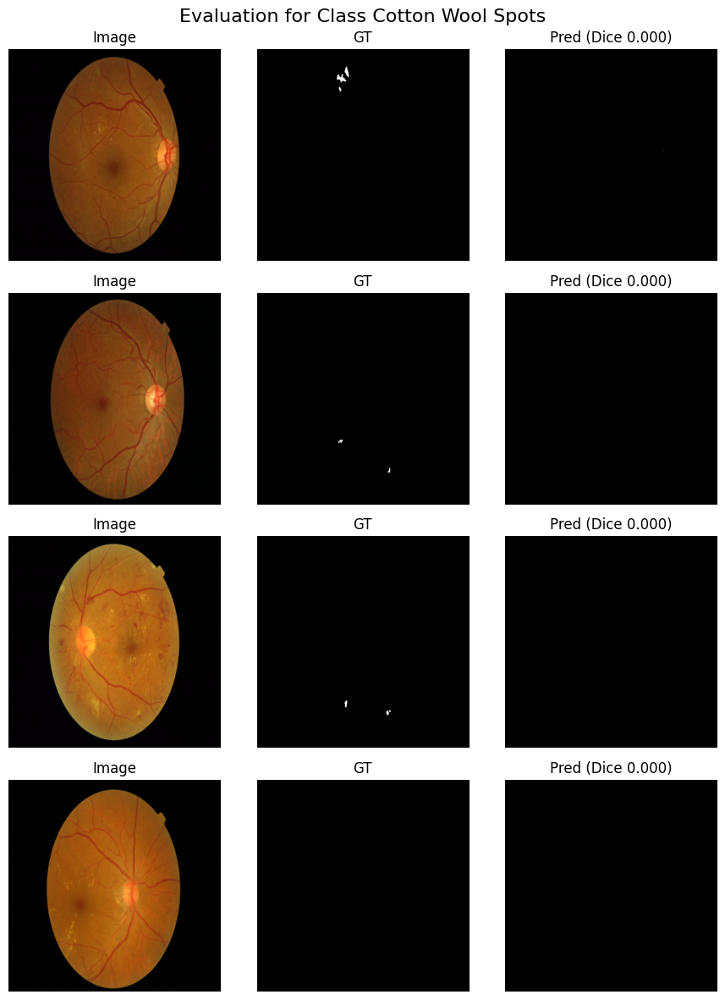


──────────────────────────────────────────────────────────────────────────────────────────


══════════════════════════════════════════════════════════════════════════════════════════
STARTING TRAINING → Class 4 : DRUSEN
Loss type: Tversky (rare/tiny) | Epochs max: 120 | Batch: 8
══════════════════════════════════════════════════════════════════════════════════════════


Training class 4: Drusen | loss=dice_focal_tversky
Computing positive sample weights for training set... done.


[  1/120]  Train loss: 0.9778 dice: 0.0000   |  Val loss: 0.7647 dice: 0.0000
   → New best saved (val dice: 0.0000)


[  2/120]  Train loss: 1.0107 dice: 0.0000   |  Val loss: 0.7570 dice: 0.0000
   → New best saved (val dice: 0.0000)


[  3/120]  Train loss: 1.0065 dice: 0.0000   |  Val loss: 0.7548 dice: 0.2500
   → New best saved (val dice: 0.2500)


[  4/120]  Train loss: 0.9460 dice: 0.0588   |  Val loss: 0.7538 dice: 0.2500
   → New best saved (val dice: 0.2500)


[  5/120]  Train loss: 1.0039 dice: 0.0000   |  Val loss: 0.7532 dice: 0.2500
   No improvement for 1/18 epochs


[  6/120]  Train loss: 0.9447 dice: 0.0588   |  Val loss: 0.7528 dice: 0.2500
   No improvement for 2/18 epochs


[  7/120]  Train loss: 1.0030 dice: 0.0000   |  Val loss: 0.7525 dice: 0.2500
   No improvement for 3/18 epochs


[  8/120]  Train loss: 1.0028 dice: 0.0000   |  Val loss: 0.7522 dice: 0.2500
   No improvement for 4/18 epochs


[  9/120]  Train loss: 1.0027 dice: 0.0000   |  Val loss: 0.7520 dice: 0.2500
   No improvement for 5/18 epochs


[ 10/120]  Train loss: 0.8846 dice: 0.1176   |  Val loss: 0.7518 dice: 0.2500
   No improvement for 6/18 epochs


[ 11/120]  Train loss: 0.9431 dice: 0.0588   |  Val loss: 0.7517 dice: 0.2500
   No improvement for 7/18 epochs


[ 12/120]  Train loss: 0.8844 dice: 0.1176   |  Val loss: 0.7516 dice: 0.2500
   No improvement for 8/18 epochs


[ 13/120]  Train loss: 0.9431 dice: 0.0588   |  Val loss: 0.7515 dice: 0.2500
   No improvement for 9/18 epochs


[ 14/120]  Train loss: 1.0020 dice: 0.0000   |  Val loss: 0.7514 dice: 0.2500
   No improvement for 10/18 epochs


[ 15/120]  Train loss: 0.9431 dice: 0.0588   |  Val loss: 0.7514 dice: 0.2500
   No improvement for 11/18 epochs


[ 16/120]  Train loss: 1.0018 dice: 0.0000   |  Val loss: 0.7513 dice: 0.2500
   No improvement for 12/18 epochs


[ 17/120]  Train loss: 0.9429 dice: 0.0588   |  Val loss: 0.7513 dice: 0.2500
   No improvement for 13/18 epochs


[ 18/120]  Train loss: 0.9431 dice: 0.0588   |  Val loss: 0.7512 dice: 0.2500
   No improvement for 14/18 epochs


[ 19/120]  Train loss: 1.0016 dice: 0.0000   |  Val loss: 0.7511 dice: 0.2500
   No improvement for 15/18 epochs


[ 20/120]  Train loss: 1.0015 dice: 0.0000   |  Val loss: 0.7511 dice: 0.2500
   No improvement for 16/18 epochs


[ 21/120]  Train loss: 0.9428 dice: 0.0588   |  Val loss: 0.7511 dice: 0.2500
   No improvement for 17/18 epochs


[ 22/120]  Train loss: 0.9426 dice: 0.0588   |  Val loss: 0.7510 dice: 0.2500
   No improvement for 18/18 epochs
Early stopping at epoch 22
Training completed for class 4. Best val Dice: 0.2500

Class 4 training finished in 6.9 minutes


Class 4 – Drusen
  Mean Dice: 0.0000
  Mean IoU: 0.0000


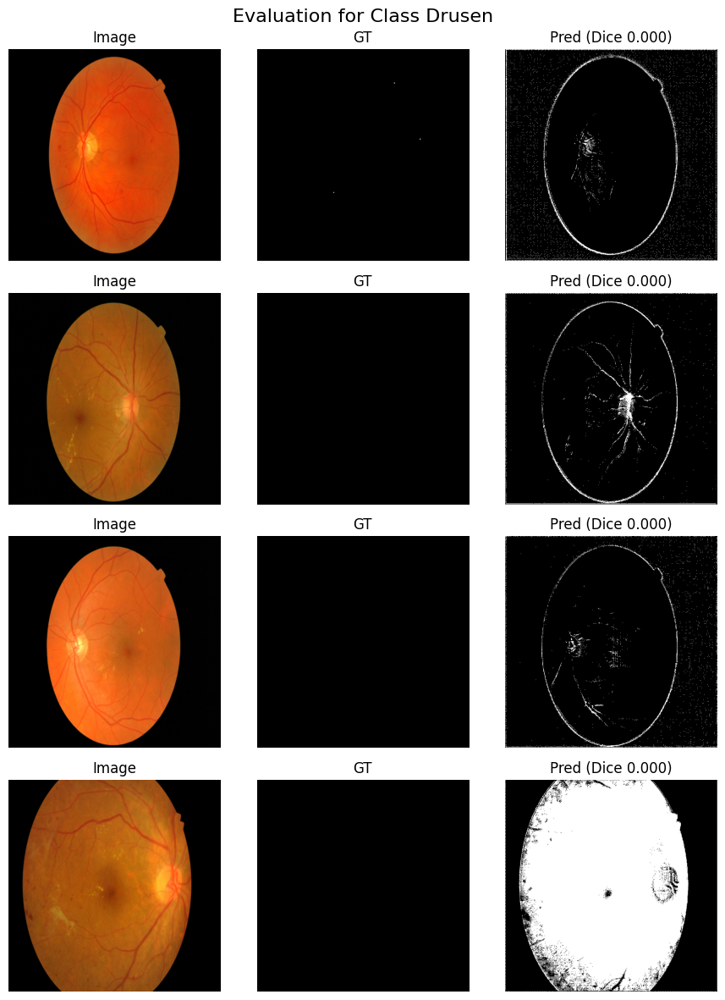


──────────────────────────────────────────────────────────────────────────────────────────


══════════════════════════════════════════════════════════════════════════════════════════
STARTING TRAINING → Class 5 : NEOVASCULARIZATION
Loss type: Tversky (rare/tiny) | Epochs max: 120 | Batch: 8
══════════════════════════════════════════════════════════════════════════════════════════


Training class 5: Neovascularization | loss=dice_focal_tversky
Computing positive sample weights for training set... done.


[  1/120]  Train loss: 0.2027 dice: 0.0008   |  Val loss: 0.0103 dice: 0.0000
   → New best saved (val dice: 0.0000)


[  2/120]  Train loss: 0.1247 dice: 0.0588   |  Val loss: 0.0053 dice: 0.5000
   → New best saved (val dice: 0.5000)


[  3/120]  Train loss: 0.1217 dice: 0.4118   |  Val loss: 0.0038 dice: 1.0000
   → New best saved (val dice: 1.0000)


[  4/120]  Train loss: 0.2969 dice: 0.4706   |  Val loss: 0.0031 dice: 1.0000
   No improvement for 1/18 epochs


[  5/120]  Train loss: 0.1202 dice: 0.7647   |  Val loss: 0.0027 dice: 1.0000
   No improvement for 2/18 epochs


[  6/120]  Train loss: 0.1200 dice: 0.8824   |  Val loss: 0.0024 dice: 1.0000
   No improvement for 3/18 epochs


[  7/120]  Train loss: 0.1780 dice: 0.8235   |  Val loss: 0.0022 dice: 1.0000
   No improvement for 4/18 epochs


[  8/120]  Train loss: 0.2370 dice: 0.7647   |  Val loss: 0.0021 dice: 1.0000
   No improvement for 5/18 epochs


[  9/120]  Train loss: 0.1779 dice: 0.8235   |  Val loss: 0.0019 dice: 1.0000
   No improvement for 6/18 epochs


[ 10/120]  Train loss: 0.1191 dice: 0.8824   |  Val loss: 0.0017 dice: 1.0000
   No improvement for 7/18 epochs


[ 11/120]  Train loss: 0.2357 dice: 0.7647   |  Val loss: 0.0017 dice: 1.0000
   No improvement for 8/18 epochs


[ 12/120]  Train loss: 0.1777 dice: 0.8235   |  Val loss: 0.0016 dice: 1.0000
   No improvement for 9/18 epochs


[ 13/120]  Train loss: 0.1189 dice: 0.8824   |  Val loss: 0.0015 dice: 1.0000
   No improvement for 10/18 epochs


[ 14/120]  Train loss: 0.2364 dice: 0.7647   |  Val loss: 0.0014 dice: 1.0000
   No improvement for 11/18 epochs


[ 15/120]  Train loss: 0.1188 dice: 0.8824   |  Val loss: 0.0014 dice: 1.0000
   No improvement for 12/18 epochs


[ 16/120]  Train loss: 0.1774 dice: 0.8235   |  Val loss: 0.0013 dice: 1.0000
   No improvement for 13/18 epochs


[ 17/120]  Train loss: 0.1776 dice: 0.8235   |  Val loss: 0.0013 dice: 1.0000
   No improvement for 14/18 epochs


[ 18/120]  Train loss: 0.1188 dice: 0.8824   |  Val loss: 0.0012 dice: 1.0000
   No improvement for 15/18 epochs


[ 19/120]  Train loss: 0.2358 dice: 0.7647   |  Val loss: 0.0012 dice: 1.0000
   No improvement for 16/18 epochs


[ 20/120]  Train loss: 0.1182 dice: 0.8824   |  Val loss: 0.0012 dice: 1.0000
   No improvement for 17/18 epochs


[ 21/120]  Train loss: 0.1768 dice: 0.7647   |  Val loss: 0.0012 dice: 1.0000
   No improvement for 18/18 epochs
Early stopping at epoch 21
Training completed for class 5. Best val Dice: 1.0000

Class 5 training finished in 6.6 minutes


Class 5 – Neovascularization
  Mean Dice: 0.0001
  Mean IoU: 0.0001


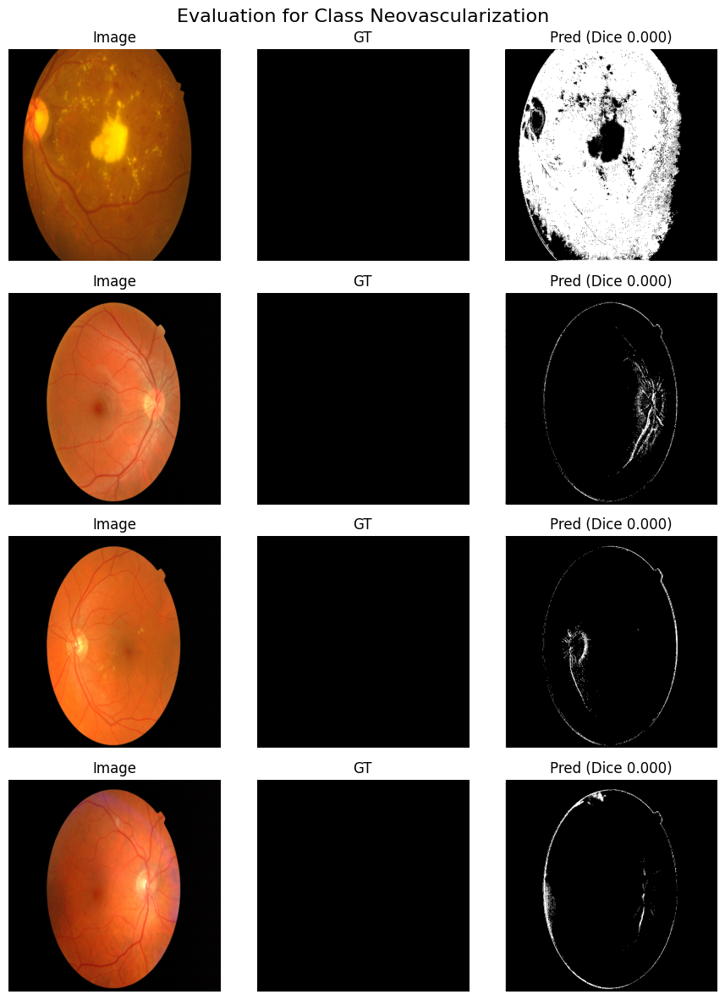


──────────────────────────────────────────────────────────────────────────────────────────


══════════════════════════════════════════════════════════════════════════════════════════
STARTING TRAINING → Class 6 : OPTIC DISC
Loss type: Focal | Epochs max: 120 | Batch: 8
══════════════════════════════════════════════════════════════════════════════════════════


Training class 6: Optic Disc | loss=dice_focal_tversky
Computing positive sample weights for training set... done.


[  1/120]  Train loss: 1.0019 dice: 0.0047   |  Val loss: 1.0188 dice: 0.0021
   → New best saved (val dice: 0.0021)


[  2/120]  Train loss: 1.0096 dice: 0.0004   |  Val loss: 0.9999 dice: 0.0018
   No improvement for 1/18 epochs


[  3/120]  Train loss: 0.9992 dice: 0.0016   |  Val loss: 0.9955 dice: 0.0001
   No improvement for 2/18 epochs


[  4/120]  Train loss: 0.8819 dice: 0.0025   |  Val loss: 0.9849 dice: 0.0660
   → New best saved (val dice: 0.0660)


[  5/120]  Train loss: 0.8782 dice: 0.0306   |  Val loss: 0.9789 dice: 0.2864
   → New best saved (val dice: 0.2864)


[  6/120]  Train loss: 0.9382 dice: 0.0048   |  Val loss: 0.9828 dice: 0.0483
   No improvement for 1/18 epochs


[  7/120]  Train loss: 0.8759 dice: 0.0777   |  Val loss: 0.9733 dice: 0.5474
   → New best saved (val dice: 0.5474)


[  8/120]  Train loss: 0.9339 dice: 0.0977   |  Val loss: 0.9802 dice: 0.1275
   No improvement for 1/18 epochs


[  9/120]  Train loss: 0.9930 dice: 0.0550   |  Val loss: 0.9836 dice: 0.2058
   No improvement for 2/18 epochs


[ 10/120]  Train loss: 0.9866 dice: 0.2028   |  Val loss: 0.9661 dice: 0.4902
   No improvement for 3/18 epochs


[ 11/120]  Train loss: 0.9905 dice: 0.1353   |  Val loss: 0.9769 dice: 0.3200
   No improvement for 4/18 epochs


[ 12/120]  Train loss: 0.7532 dice: 0.1966   |  Val loss: 0.9661 dice: 0.3951
   No improvement for 5/18 epochs


[ 13/120]  Train loss: 0.9859 dice: 0.1944   |  Val loss: 0.9659 dice: 0.6490
   → New best saved (val dice: 0.6490)


[ 14/120]  Train loss: 0.8681 dice: 0.2245   |  Val loss: 0.9633 dice: 0.3676
   No improvement for 1/18 epochs


[ 15/120]  Train loss: 0.9253 dice: 0.3028   |  Val loss: 0.9690 dice: 0.3295
   No improvement for 2/18 epochs


[ 16/120]  Train loss: 0.9819 dice: 0.2203   |  Val loss: 0.9587 dice: 0.5805
   No improvement for 3/18 epochs


[ 17/120]  Train loss: 0.9224 dice: 0.3016   |  Val loss: 0.9679 dice: 0.2381
   No improvement for 4/18 epochs


[ 18/120]  Train loss: 0.9210 dice: 0.2047   |  Val loss: 0.9602 dice: 0.3364
   No improvement for 5/18 epochs


[ 19/120]  Train loss: 0.8032 dice: 0.3648   |  Val loss: 0.9600 dice: 0.3462
   No improvement for 6/18 epochs


[ 20/120]  Train loss: 0.9191 dice: 0.2719   |  Val loss: 0.9522 dice: 0.3726
   No improvement for 7/18 epochs


[ 21/120]  Train loss: 0.8596 dice: 0.2984   |  Val loss: 0.9532 dice: 0.3755
   No improvement for 8/18 epochs


[ 22/120]  Train loss: 0.9702 dice: 0.2904   |  Val loss: 0.9489 dice: 0.4149
   No improvement for 9/18 epochs


[ 23/120]  Train loss: 0.9112 dice: 0.2944   |  Val loss: 0.9447 dice: 0.3789
   No improvement for 10/18 epochs


[ 24/120]  Train loss: 0.8060 dice: 0.3209   |  Val loss: 0.9478 dice: 0.3371
   No improvement for 11/18 epochs


[ 25/120]  Train loss: 0.9630 dice: 0.2967   |  Val loss: 0.9468 dice: 0.3754
   No improvement for 12/18 epochs


[ 26/120]  Train loss: 0.9121 dice: 0.2490   |  Val loss: 0.9442 dice: 0.3558
   No improvement for 13/18 epochs


[ 27/120]  Train loss: 0.9639 dice: 0.3105   |  Val loss: 0.9500 dice: 0.3442
   No improvement for 14/18 epochs


[ 28/120]  Train loss: 0.9142 dice: 0.3485   |  Val loss: 0.9395 dice: 0.3855
   No improvement for 15/18 epochs


[ 29/120]  Train loss: 0.9636 dice: 0.2925   |  Val loss: 0.9426 dice: 0.3552
   No improvement for 16/18 epochs


[ 30/120]  Train loss: 0.9038 dice: 0.3641   |  Val loss: 0.9445 dice: 0.3632
   No improvement for 17/18 epochs


[ 31/120]  Train loss: 0.9644 dice: 0.2992   |  Val loss: 0.9436 dice: 0.3628
   No improvement for 18/18 epochs
Early stopping at epoch 31
Training completed for class 6. Best val Dice: 0.6490

Class 6 training finished in 10.5 minutes


Class 6 – Optic Disc
  Mean Dice: 0.2941
  Mean IoU: 0.1724


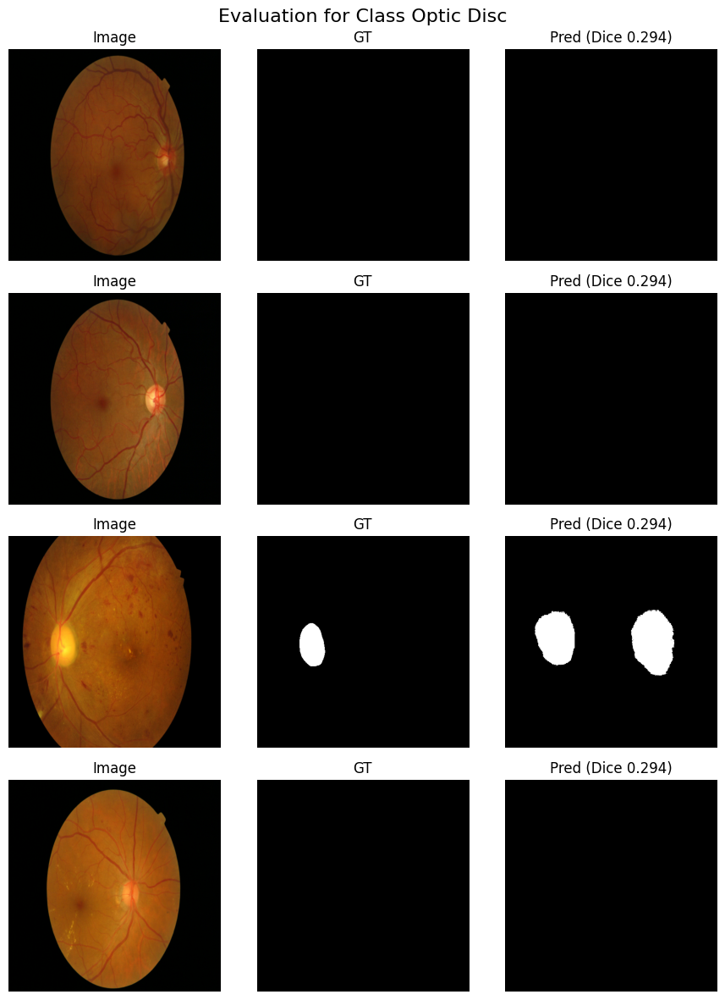


──────────────────────────────────────────────────────────────────────────────────────────



In [15]:
# ─── Main training loop ─────────────────────────────────────────────────────
for cls in range(7):
    # Inside the for cls loop, before calling train_model_for_class:
    if cls in [4, 5]:  # Drusen, Neovascularization — tiny & rare
        loss_type = 'dice_focal_tversky'   # strongest combo for recall
    elif cls == 6:     # Optic Disc — sharp boundaries
        loss_type = 'dice_focal_tversky'           # or 'dice_boundary' if you want edges
    else:
        loss_type = 'dice_focal_tversky'           # common classes

    print("\n" + "═"*90)
    print(f"STARTING TRAINING → Class {cls} : {class_names[cls].upper()}")
    print(f"Loss type: {'Tversky (rare/tiny)' if cls in [4,5] else 'Focal'} | "
      f"Epochs max: 120 | Batch: 8")
    print("═"*90 + "\n")

    start_time = time.time()

    model, test_dataset, test_loader = train_model_for_class(
        class_idx=cls,
        epochs=120,
        batch_size=8,
        lr=1e-4,
        loss_type=loss_type,
        patience_early=18,
        patience_plateau=7,
        min_lr=1e-6
    )

    duration = (time.time() - start_time) / 60
    print(f"\nClass {cls} training finished in {duration:.1f} minutes\n")

    # Evaluate
    evaluate_class_model(cls, model, test_loader)

    if torch.cuda.is_available():
        torch.cuda.empty_cache()

    print("\n" + "─"*90 + "\n")

CEll 10.0

Cell 10.1


══════════════════════════════════════════════════════════════════════════════════════════
STARTING TRAINING → Class 0 : MICROANEURYSMS
Loss type: dice_focal | Epochs max: 200 | Batch: 8
══════════════════════════════════════════════════════════════════════════════════════════


Training class 0: Microaneurysms | loss=dice_focal
Computing positive sample weights... done.
Applied initial bias = -3.5 to final conv layer (for tiny lesions)
Resumed from epoch 138/200 (best dice: 0.0307)


[139/200]  Train loss: 1.0441 dice: 0.0566    |  Val loss: 1.0503 dice: 0.0143
   No improvement for 18/18 epochs
Early stopping at epoch 139
Training completed for class 0. Best val Dice: 0.0307


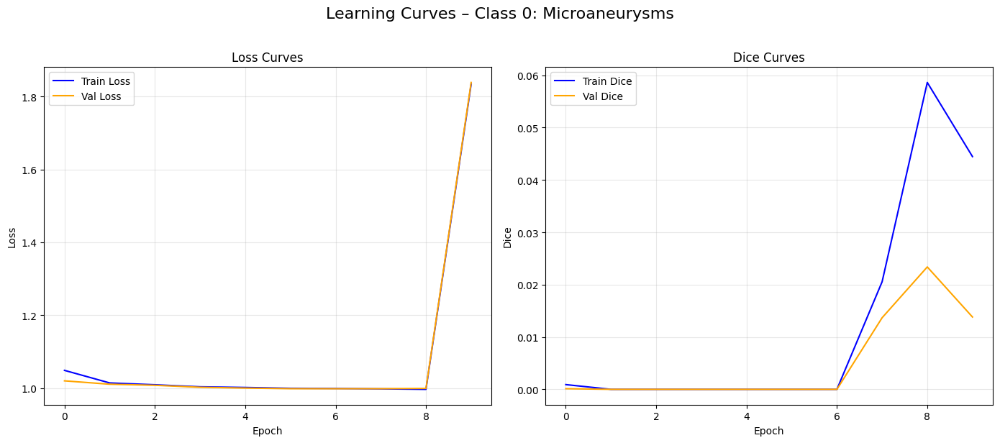


Class 0 training finished in 0.4 minutes


Class 0 – Microaneurysms
  Mean Dice: 0.0170
  Mean IoU: 0.0086


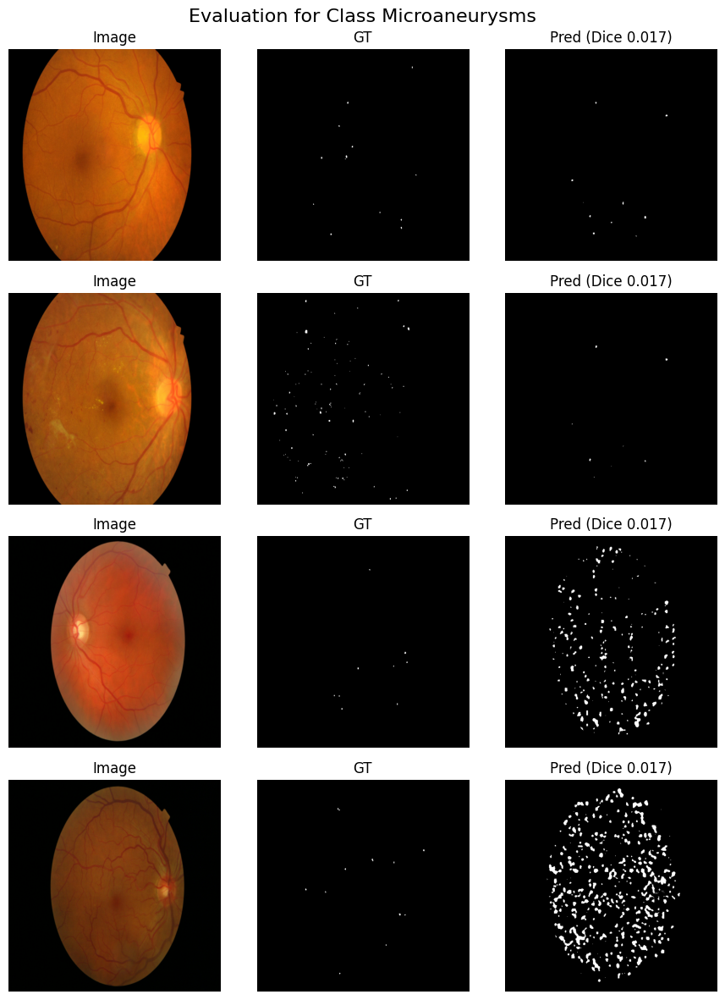


──────────────────────────────────────────────────────────────────────────────────────────



In [39]:
cls = 0
loss_type = 'dice_focal'  # strong for tiny lesions
print("\n" + "═"*90)
print(f"STARTING TRAINING → Class {cls} : {class_names[cls].upper()}")
print(f"Loss type: {loss_type} | Epochs max: 200 | Batch: 8")
print("═"*90 + "\n")

start_time = time.time()

model, test_dataset, test_loader = train_model_for_class(
    class_idx=cls,
    epochs=200,
    batch_size=8,
    lr=1e-4,
    loss_type=loss_type,
    patience_early=18,
    patience_plateau=7,
    min_lr=1e-6
)

duration = (time.time() - start_time) / 60
print(f"\nClass {cls} training finished in {duration:.1f} minutes\n")

evaluate_class_model(cls, model, test_loader)

if torch.cuda.is_available():
    torch.cuda.empty_cache()

print("\n" + "─"*90 + "\n")


══════════════════════════════════════════════════════════════════════════════════════════
STARTING TRAINING → Class 1 : HEMORRHAGES
Loss type: dice_focal_tversky | Epochs max:200 | Batch: 8
══════════════════════════════════════════════════════════════════════════════════════════


Training class 1: Hemorrhages | loss=dice_focal_tversky
Computing positive sample weights... done.
Resumed from epoch 49/200 (best dice: 0.0274)


[ 50/200]  Train loss: 1.8042 dice: 0.0849    |  Val loss: 1.8362 dice: 0.0170
   No improvement for 18/30 epochs


[ 51/200]  Train loss: 1.7830 dice: 0.1424    |  Val loss: 1.8366 dice: 0.0176
   No improvement for 19/30 epochs


[ 52/200]  Train loss: 1.7814 dice: 0.1218    |  Val loss: 1.8361 dice: 0.0170
   No improvement for 20/30 epochs


[ 53/200]  Train loss: 1.8233 dice: 0.0382    |  Val loss: 1.8363 dice: 0.0163
   No improvement for 21/30 epochs


[ 54/200]  Train loss: 1.8312 dice: 0.0188    |  Val loss: 1.8357 dice: 0.0180
   No improvement for 22/30 epochs


[ 55/200]  Train loss: 1.8219 dice: 0.0490    |  Val loss: 1.8346 dice: 0.0209
   No improvement for 23/30 epochs


[ 56/200]  Train loss: 1.8215 dice: 0.0472    |  Val loss: 1.8351 dice: 0.0190
   No improvement for 24/30 epochs


[ 57/200]  Train loss: 1.8238 dice: 0.0532    |  Val loss: 1.8358 dice: 0.0168
   No improvement for 25/30 epochs


[ 58/200]  Train loss: 1.8290 dice: 0.0207    |  Val loss: 1.8364 dice: 0.0154
   No improvement for 26/30 epochs


[ 59/200]  Train loss: 1.8041 dice: 0.0810    |  Val loss: 1.8347 dice: 0.0198
   No improvement for 27/30 epochs


[ 60/200]  Train loss: 1.8069 dice: 0.0752    |  Val loss: 1.8344 dice: 0.0171
   No improvement for 28/30 epochs


[ 61/200]  Train loss: 1.8021 dice: 0.1121    |  Val loss: 1.8354 dice: 0.0184
   No improvement for 29/30 epochs


[ 62/200]  Train loss: 1.8321 dice: 0.0200    |  Val loss: 1.8360 dice: 0.0156
   No improvement for 30/30 epochs
Early stopping at epoch 62
Training completed for class 1. Best val Dice: 0.0274


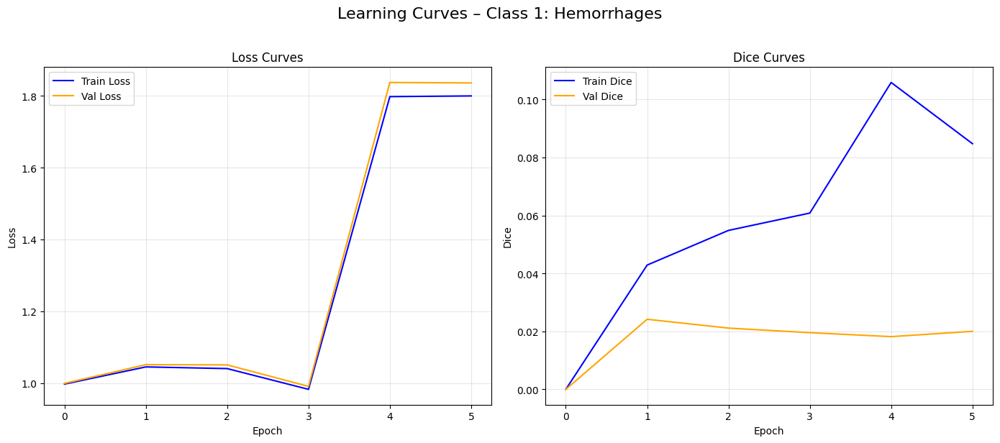


Class 1 training finished in 4.7 minutes


Class 1 – Hemorrhages
  Mean Dice: 0.0225
  Mean IoU: 0.0114


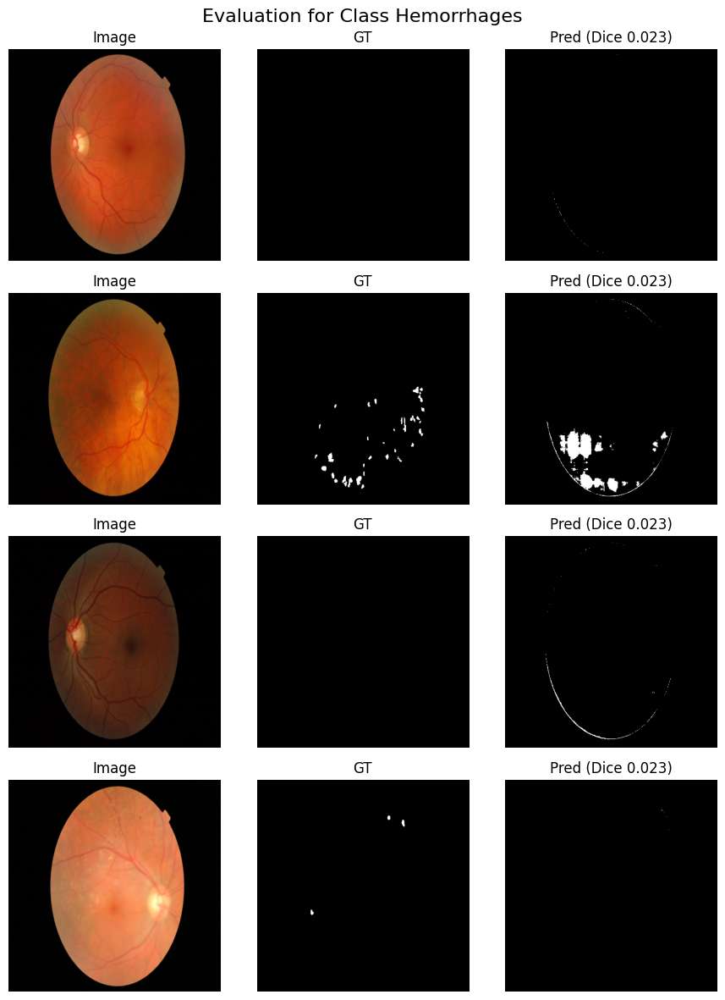


──────────────────────────────────────────────────────────────────────────────────────────



In [47]:
cls = 1
loss_type = 'dice_focal_tversky'  # adjust if needed

print("\n" + "═"*90)
print(f"STARTING TRAINING → Class {cls} : {class_names[cls].upper()}")
print(f"Loss type: {loss_type} | Epochs max:200 | Batch: 8")
print("═"*90 + "\n")

start_time = time.time()

model, test_dataset, test_loader = train_model_for_class(
    class_idx=cls,
    epochs=200,
    batch_size=8,
    lr=1e-4,
    loss_type=loss_type,
    patience_early=30,
    patience_plateau=7,
    min_lr=1e-6
)

duration = (time.time() - start_time) / 60
print(f"\nClass {cls} training finished in {duration:.1f} minutes\n")

evaluate_class_model(cls, model, test_loader)

if torch.cuda.is_available():
    torch.cuda.empty_cache()

print("\n" + "─"*90 + "\n")


══════════════════════════════════════════════════════════════════════════════════════════
STARTING TRAINING → Class 2 : EXUDATES
Loss type: dice_focal_tversky | Epochs max: 200 | Batch: 8
══════════════════════════════════════════════════════════════════════════════════════════


Training class 2: Exudates | loss=dice_focal_tversky
Computing positive sample weights... done.
Resumed from epoch 50/200 (best dice: 0.0278)


[ 51/200]  Train loss: 1.8238 dice: 0.0513    |  Val loss: 1.8303 dice: 0.0238
   No improvement for 18/50 epochs


[ 52/200]  Train loss: 1.8196 dice: 0.0645    |  Val loss: 1.8303 dice: 0.0221
   No improvement for 19/50 epochs


[ 53/200]  Train loss: 1.8101 dice: 0.0922    |  Val loss: 1.8300 dice: 0.0225
   No improvement for 20/50 epochs


[ 54/200]  Train loss: 1.8157 dice: 0.0553    |  Val loss: 1.8298 dice: 0.0225
   No improvement for 21/50 epochs


[ 55/200]  Train loss: 1.8265 dice: 0.0483    |  Val loss: 1.8304 dice: 0.0202
   No improvement for 22/50 epochs


[ 56/200]  Train loss: 1.8232 dice: 0.0536    |  Val loss: 1.8310 dice: 0.0194
   No improvement for 23/50 epochs


[ 57/200]  Train loss: 1.8188 dice: 0.0710    |  Val loss: 1.8305 dice: 0.0202
   No improvement for 24/50 epochs


[ 58/200]  Train loss: 1.8292 dice: 0.0339    |  Val loss: 1.8303 dice: 0.0201
   No improvement for 25/50 epochs


[ 59/200]  Train loss: 1.8265 dice: 0.0412    |  Val loss: 1.8302 dice: 0.0207
   No improvement for 26/50 epochs


[ 60/200]  Train loss: 1.8188 dice: 0.0629    |  Val loss: 1.8301 dice: 0.0207
   No improvement for 27/50 epochs


[ 61/200]  Train loss: 1.8166 dice: 0.0673    |  Val loss: 1.8307 dice: 0.0198
   No improvement for 28/50 epochs


[ 62/200]  Train loss: 1.8226 dice: 0.0528    |  Val loss: 1.8304 dice: 0.0206
   No improvement for 29/50 epochs


[ 63/200]  Train loss: 1.8258 dice: 0.0443    |  Val loss: 1.8299 dice: 0.0222
   No improvement for 30/50 epochs


[ 64/200]  Train loss: 1.8207 dice: 0.0563    |  Val loss: 1.8298 dice: 0.0234
   No improvement for 31/50 epochs


[ 65/200]  Train loss: 1.8170 dice: 0.0672    |  Val loss: 1.8297 dice: 0.0228
   No improvement for 32/50 epochs


[ 66/200]  Train loss: 1.8263 dice: 0.0405    |  Val loss: 1.8300 dice: 0.0222
   No improvement for 33/50 epochs


[ 67/200]  Train loss: 1.8264 dice: 0.0502    |  Val loss: 1.8300 dice: 0.0233
   No improvement for 34/50 epochs


[ 68/200]  Train loss: 1.8206 dice: 0.0484    |  Val loss: 1.8299 dice: 0.0236
   No improvement for 35/50 epochs


[ 69/200]  Train loss: 1.8242 dice: 0.0395    |  Val loss: 1.8296 dice: 0.0242
   No improvement for 36/50 epochs


[ 70/200]  Train loss: 1.8242 dice: 0.0538    |  Val loss: 1.8297 dice: 0.0236
   No improvement for 37/50 epochs


[ 71/200]  Train loss: 1.8252 dice: 0.0464    |  Val loss: 1.8296 dice: 0.0234
   No improvement for 38/50 epochs


[ 72/200]  Train loss: 1.8201 dice: 0.0549    |  Val loss: 1.8296 dice: 0.0234
   No improvement for 39/50 epochs


[ 73/200]  Train loss: 1.8231 dice: 0.0484    |  Val loss: 1.8295 dice: 0.0235
   No improvement for 40/50 epochs


[ 74/200]  Train loss: 1.8262 dice: 0.0449    |  Val loss: 1.8296 dice: 0.0231
   No improvement for 41/50 epochs


[ 75/200]  Train loss: 1.8175 dice: 0.0664    |  Val loss: 1.8297 dice: 0.0228
   No improvement for 42/50 epochs


[ 76/200]  Train loss: 1.8101 dice: 0.0754    |  Val loss: 1.8297 dice: 0.0227
   No improvement for 43/50 epochs


[ 77/200]  Train loss: 1.8148 dice: 0.0673    |  Val loss: 1.8299 dice: 0.0219
   No improvement for 44/50 epochs


[ 78/200]  Train loss: 1.8265 dice: 0.0385    |  Val loss: 1.8300 dice: 0.0218
   No improvement for 45/50 epochs


[ 79/200]  Train loss: 1.8242 dice: 0.0437    |  Val loss: 1.8299 dice: 0.0219
   No improvement for 46/50 epochs


[ 80/200]  Train loss: 1.8168 dice: 0.0678    |  Val loss: 1.8299 dice: 0.0220
   No improvement for 47/50 epochs


[ 81/200]  Train loss: 1.8205 dice: 0.0498    |  Val loss: 1.8300 dice: 0.0219
   No improvement for 48/50 epochs


[ 82/200]  Train loss: 1.8151 dice: 0.0557    |  Val loss: 1.8299 dice: 0.0220
   No improvement for 49/50 epochs


[ 83/200]  Train loss: 1.8255 dice: 0.0483    |  Val loss: 1.8298 dice: 0.0224
   No improvement for 50/50 epochs
Early stopping at epoch 83
Training completed for class 2. Best val Dice: 0.0278


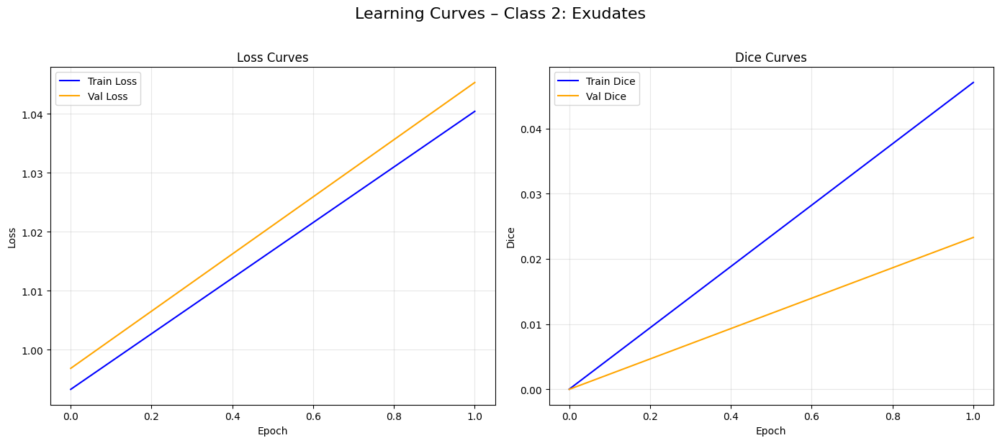


Class 2 training finished in 11.8 minutes


Class 2 – Exudates
  Mean Dice: 0.0940
  Mean IoU: 0.0493


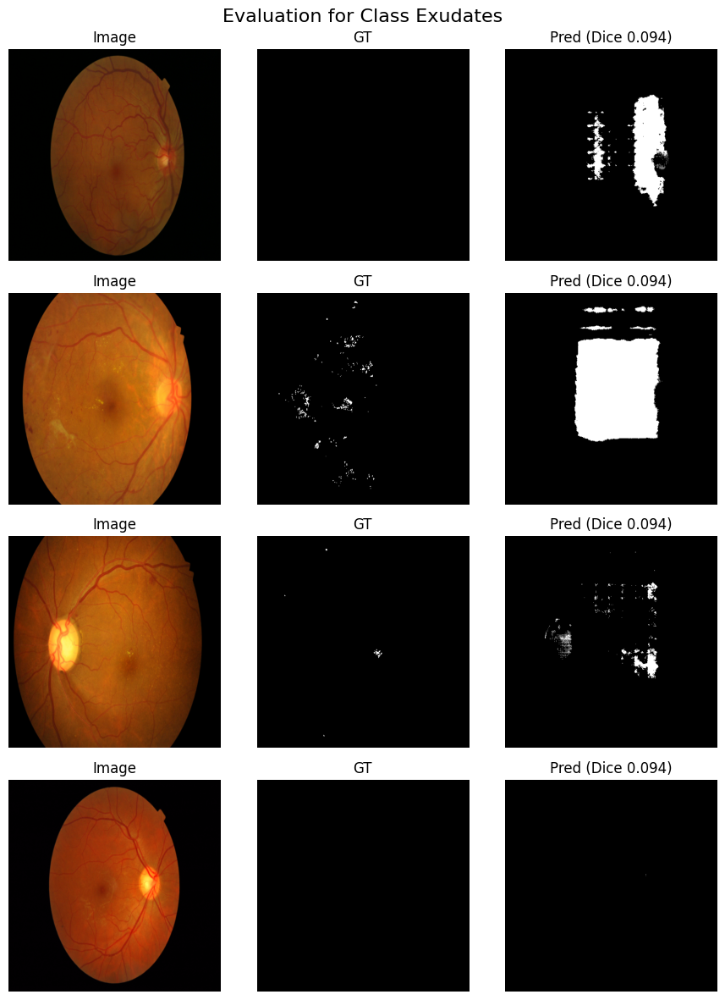


──────────────────────────────────────────────────────────────────────────────────────────



In [50]:
cls = 2
loss_type = 'dice_focal_tversky'  # adjust if needed

print("\n" + "═"*90)
print(f"STARTING TRAINING → Class {cls} : {class_names[cls].upper()}")
print(f"Loss type: {loss_type} | Epochs max: 200 | Batch: 8")
print("═"*90 + "\n")

start_time = time.time()

model, test_dataset, test_loader = train_model_for_class(
    class_idx=cls,
    epochs=200,
    batch_size=8,
    lr=1e-4,
    loss_type=loss_type,
    patience_early=50,
    patience_plateau=7,
    min_lr=1e-6
)

duration = (time.time() - start_time) / 60
print(f"\nClass {cls} training finished in {duration:.1f} minutes\n")

evaluate_class_model(cls, model, test_loader)

if torch.cuda.is_available():
    torch.cuda.empty_cache()

print("\n" + "─"*90 + "\n")

10.4


══════════════════════════════════════════════════════════════════════════════════════════
STARTING TRAINING → Class 3 : COTTON WOOL SPOTS
Loss type: dice_focal_tversky | Epochs max: 400 | Batch: 8
══════════════════════════════════════════════════════════════════════════════════════════


Training class 3: Cotton Wool Spots | loss=dice_focal_tversky
Computing positive sample weights... done.
Resumed from epoch 159/400 (best dice: 0.0058)


[160/400]  Train loss: 1.8343 dice: 0.0526    |  Val loss: 1.8392 dice: 0.0052
   No improvement for 50/100 epochs


[161/400]  Train loss: 1.8363 dice: 0.0219    |  Val loss: 1.8392 dice: 0.0050
   No improvement for 51/100 epochs


[162/400]  Train loss: 1.8359 dice: 0.0318    |  Val loss: 1.8392 dice: 0.0049
   No improvement for 52/100 epochs


[163/400]  Train loss: 1.8351 dice: 0.0324    |  Val loss: 1.8393 dice: 0.0043
   No improvement for 53/100 epochs


[164/400]  Train loss: 1.6254 dice: 0.0202    |  Val loss: 1.8393 dice: 0.0038
   No improvement for 54/100 epochs


[165/400]  Train loss: 1.8358 dice: 0.0305    |  Val loss: 1.8393 dice: 0.0033
   No improvement for 55/100 epochs


[166/400]  Train loss: 1.8347 dice: 0.0369    |  Val loss: 1.8393 dice: 0.0018
   No improvement for 56/100 epochs


[167/400]  Train loss: 1.7312 dice: 0.0231    |  Val loss: 1.8393 dice: 0.0007
   No improvement for 57/100 epochs


[168/400]  Train loss: 1.8327 dice: 0.0576    |  Val loss: 1.8393 dice: 0.0008
   No improvement for 58/100 epochs


[169/400]  Train loss: 1.8351 dice: 0.0394    |  Val loss: 1.8393 dice: 0.0032
   No improvement for 59/100 epochs


[170/400]  Train loss: 1.8357 dice: 0.0385    |  Val loss: 1.8393 dice: 0.0034
   No improvement for 60/100 epochs


[171/400]  Train loss: 1.8355 dice: 0.0220    |  Val loss: 1.8393 dice: 0.0029
   No improvement for 61/100 epochs


[172/400]  Train loss: 1.8349 dice: 0.0373    |  Val loss: 1.8393 dice: 0.0034
   No improvement for 62/100 epochs


[173/400]  Train loss: 1.8359 dice: 0.0344    |  Val loss: 1.8393 dice: 0.0031
   No improvement for 63/100 epochs


[174/400]  Train loss: 1.8347 dice: 0.0298    |  Val loss: 1.8393 dice: 0.0038
   No improvement for 64/100 epochs


[175/400]  Train loss: 1.8350 dice: 0.0287    |  Val loss: 1.8393 dice: 0.0038
   No improvement for 65/100 epochs


[176/400]  Train loss: 1.7289 dice: 0.0330    |  Val loss: 1.8393 dice: 0.0047
   No improvement for 66/100 epochs


[177/400]  Train loss: 1.8358 dice: 0.0269    |  Val loss: 1.8393 dice: 0.0047
   No improvement for 67/100 epochs


[178/400]  Train loss: 1.7294 dice: 0.0271    |  Val loss: 1.8393 dice: 0.0048
   No improvement for 68/100 epochs


[179/400]  Train loss: 1.6260 dice: 0.0168    |  Val loss: 1.8393 dice: 0.0049
   No improvement for 69/100 epochs


[180/400]  Train loss: 1.6226 dice: 0.0450    |  Val loss: 1.8392 dice: 0.0049
   No improvement for 70/100 epochs


[181/400]  Train loss: 1.8346 dice: 0.0393    |  Val loss: 1.8392 dice: 0.0053
   No improvement for 71/100 epochs


[182/400]  Train loss: 1.8337 dice: 0.0485    |  Val loss: 1.8392 dice: 0.0052
   No improvement for 72/100 epochs


[183/400]  Train loss: 1.8337 dice: 0.0389    |  Val loss: 1.8393 dice: 0.0050
   No improvement for 73/100 epochs


[184/400]  Train loss: 1.8340 dice: 0.0460    |  Val loss: 1.8393 dice: 0.0046
   No improvement for 74/100 epochs


[185/400]  Train loss: 1.8340 dice: 0.0501    |  Val loss: 1.8393 dice: 0.0051
   No improvement for 75/100 epochs


[186/400]  Train loss: 1.8360 dice: 0.0266    |  Val loss: 1.8392 dice: 0.0059
   → New best saved (val dice: 0.0059)


[187/400]  Train loss: 1.8343 dice: 0.0364    |  Val loss: 1.8392 dice: 0.0058
   No improvement for 1/100 epochs


[188/400]  Train loss: 1.7283 dice: 0.0395    |  Val loss: 1.8393 dice: 0.0056
   No improvement for 2/100 epochs


[189/400]  Train loss: 1.8348 dice: 0.0411    |  Val loss: 1.8393 dice: 0.0055
   No improvement for 3/100 epochs


[190/400]  Train loss: 1.7290 dice: 0.0576    |  Val loss: 1.8393 dice: 0.0055
   No improvement for 4/100 epochs


[191/400]  Train loss: 1.8362 dice: 0.0162    |  Val loss: 1.8393 dice: 0.0053
   No improvement for 5/100 epochs


[192/400]  Train loss: 1.8336 dice: 0.0324    |  Val loss: 1.8393 dice: 0.0052
   No improvement for 6/100 epochs


[193/400]  Train loss: 1.8349 dice: 0.0336    |  Val loss: 1.8393 dice: 0.0052
   No improvement for 7/100 epochs


[194/400]  Train loss: 1.8357 dice: 0.0298    |  Val loss: 1.8392 dice: 0.0054
   No improvement for 8/100 epochs


[195/400]  Train loss: 1.8333 dice: 0.0419    |  Val loss: 1.8393 dice: 0.0055
   No improvement for 9/100 epochs


[196/400]  Train loss: 1.8353 dice: 0.0202    |  Val loss: 1.8392 dice: 0.0057
   No improvement for 10/100 epochs


[197/400]  Train loss: 1.7256 dice: 0.0608    |  Val loss: 1.8391 dice: 0.0059
   → New best saved (val dice: 0.0059)


[198/400]  Train loss: 1.8351 dice: 0.0255    |  Val loss: 1.8391 dice: 0.0059
   → New best saved (val dice: 0.0059)


[199/400]  Train loss: 1.8364 dice: 0.0224    |  Val loss: 1.8391 dice: 0.0062
   → New best saved (val dice: 0.0062)


[200/400]  Train loss: 1.8362 dice: 0.0319    |  Val loss: 1.8391 dice: 0.0063
   → New best saved (val dice: 0.0063)


[201/400]  Train loss: 1.8362 dice: 0.0239    |  Val loss: 1.8391 dice: 0.0062
   No improvement for 1/100 epochs


[202/400]  Train loss: 1.8344 dice: 0.0337    |  Val loss: 1.8392 dice: 0.0060
   No improvement for 2/100 epochs


[203/400]  Train loss: 1.8319 dice: 0.0561    |  Val loss: 1.8392 dice: 0.0059
   No improvement for 3/100 epochs


[204/400]  Train loss: 1.8350 dice: 0.0276    |  Val loss: 1.8392 dice: 0.0057
   No improvement for 4/100 epochs


[205/400]  Train loss: 1.8348 dice: 0.0213    |  Val loss: 1.8392 dice: 0.0056
   No improvement for 5/100 epochs


[206/400]  Train loss: 1.7271 dice: 0.0480    |  Val loss: 1.8393 dice: 0.0056
   No improvement for 6/100 epochs


[207/400]  Train loss: 1.8360 dice: 0.0345    |  Val loss: 1.8393 dice: 0.0055
   No improvement for 7/100 epochs


[208/400]  Train loss: 1.6228 dice: 0.0299    |  Val loss: 1.8392 dice: 0.0057
   No improvement for 8/100 epochs


[209/400]  Train loss: 1.8331 dice: 0.0402    |  Val loss: 1.8392 dice: 0.0059
   No improvement for 9/100 epochs


[210/400]  Train loss: 1.8341 dice: 0.0438    |  Val loss: 1.8392 dice: 0.0063
   No improvement for 10/100 epochs


[211/400]  Train loss: 1.8350 dice: 0.0309    |  Val loss: 1.8392 dice: 0.0062
   No improvement for 11/100 epochs


[212/400]  Train loss: 1.8301 dice: 0.0581    |  Val loss: 1.8392 dice: 0.0063
   → New best saved (val dice: 0.0063)


[213/400]  Train loss: 1.8336 dice: 0.0298    |  Val loss: 1.8392 dice: 0.0063
   → New best saved (val dice: 0.0063)


[214/400]  Train loss: 1.6230 dice: 0.0280    |  Val loss: 1.8392 dice: 0.0063
   No improvement for 1/100 epochs


[215/400]  Train loss: 1.8369 dice: 0.0163    |  Val loss: 1.8392 dice: 0.0061
   No improvement for 2/100 epochs


[216/400]  Train loss: 1.8365 dice: 0.0189    |  Val loss: 1.8392 dice: 0.0061
   No improvement for 3/100 epochs


[217/400]  Train loss: 1.8343 dice: 0.0434    |  Val loss: 1.8393 dice: 0.0059
   No improvement for 4/100 epochs


[218/400]  Train loss: 1.8364 dice: 0.0280    |  Val loss: 1.8393 dice: 0.0059
   No improvement for 5/100 epochs


[219/400]  Train loss: 1.8356 dice: 0.0417    |  Val loss: 1.8392 dice: 0.0061
   No improvement for 6/100 epochs


[220/400]  Train loss: 1.6238 dice: 0.0327    |  Val loss: 1.8392 dice: 0.0064
   → New best saved (val dice: 0.0064)


[221/400]  Train loss: 1.8355 dice: 0.0337    |  Val loss: 1.8392 dice: 0.0064
   → New best saved (val dice: 0.0064)


[222/400]  Train loss: 1.8344 dice: 0.0291    |  Val loss: 1.8392 dice: 0.0069
   → New best saved (val dice: 0.0069)


[223/400]  Train loss: 1.8328 dice: 0.0310    |  Val loss: 1.8391 dice: 0.0072
   → New best saved (val dice: 0.0072)


[224/400]  Train loss: 1.8353 dice: 0.0314    |  Val loss: 1.8392 dice: 0.0067
   No improvement for 1/100 epochs


[225/400]  Train loss: 1.8323 dice: 0.0428    |  Val loss: 1.8392 dice: 0.0069
   No improvement for 2/100 epochs


[226/400]  Train loss: 1.8333 dice: 0.0433    |  Val loss: 1.8391 dice: 0.0070
   No improvement for 3/100 epochs


[227/400]  Train loss: 1.7289 dice: 0.0288    |  Val loss: 1.8392 dice: 0.0070
   No improvement for 4/100 epochs


[228/400]  Train loss: 1.8373 dice: 0.0204    |  Val loss: 1.8392 dice: 0.0069
   No improvement for 5/100 epochs


[229/400]  Train loss: 1.7301 dice: 0.0254    |  Val loss: 1.8392 dice: 0.0069
   No improvement for 6/100 epochs


[230/400]  Train loss: 1.8337 dice: 0.0483    |  Val loss: 1.8393 dice: 0.0063
   No improvement for 7/100 epochs


[231/400]  Train loss: 1.7248 dice: 0.0498    |  Val loss: 1.8391 dice: 0.0069
   No improvement for 8/100 epochs


[232/400]  Train loss: 1.8349 dice: 0.0330    |  Val loss: 1.8390 dice: 0.0076
   → New best saved (val dice: 0.0076)


[233/400]  Train loss: 1.8355 dice: 0.0341    |  Val loss: 1.8390 dice: 0.0075
   No improvement for 1/100 epochs


[234/400]  Train loss: 1.8328 dice: 0.0410    |  Val loss: 1.8391 dice: 0.0066
   No improvement for 2/100 epochs


[235/400]  Train loss: 1.8336 dice: 0.0432    |  Val loss: 1.8392 dice: 0.0064
   No improvement for 3/100 epochs


[236/400]  Train loss: 1.7279 dice: 0.0379    |  Val loss: 1.8392 dice: 0.0063
   No improvement for 4/100 epochs


[237/400]  Train loss: 1.7275 dice: 0.0461    |  Val loss: 1.8393 dice: 0.0060
   No improvement for 5/100 epochs


[238/400]  Train loss: 1.8333 dice: 0.0307    |  Val loss: 1.8394 dice: 0.0055
   No improvement for 6/100 epochs


[239/400]  Train loss: 1.6244 dice: 0.0192    |  Val loss: 1.8395 dice: 0.0050
   No improvement for 7/100 epochs


[240/400]  Train loss: 1.8321 dice: 0.0498    |  Val loss: 1.8394 dice: 0.0057
   No improvement for 8/100 epochs


[241/400]  Train loss: 1.7288 dice: 0.0515    |  Val loss: 1.8393 dice: 0.0063
   No improvement for 9/100 epochs


[242/400]  Train loss: 1.8327 dice: 0.0461    |  Val loss: 1.8391 dice: 0.0071
   No improvement for 10/100 epochs


[243/400]  Train loss: 1.7261 dice: 0.0518    |  Val loss: 1.8391 dice: 0.0073
   No improvement for 11/100 epochs


[244/400]  Train loss: 1.8329 dice: 0.0476    |  Val loss: 1.8391 dice: 0.0072
   No improvement for 12/100 epochs


[245/400]  Train loss: 1.8353 dice: 0.0239    |  Val loss: 1.8392 dice: 0.0064
   No improvement for 13/100 epochs


[246/400]  Train loss: 1.7282 dice: 0.0393    |  Val loss: 1.8394 dice: 0.0055
   No improvement for 14/100 epochs


[247/400]  Train loss: 1.6247 dice: 0.0845    |  Val loss: 1.8392 dice: 0.0059
   No improvement for 15/100 epochs


[248/400]  Train loss: 1.7285 dice: 0.0387    |  Val loss: 1.8391 dice: 0.0063
   No improvement for 16/100 epochs


[249/400]  Train loss: 1.8354 dice: 0.0416    |  Val loss: 1.8391 dice: 0.0061
   No improvement for 17/100 epochs


[250/400]  Train loss: 1.8338 dice: 0.0282    |  Val loss: 1.8392 dice: 0.0062
   No improvement for 18/100 epochs


[251/400]  Train loss: 1.8352 dice: 0.0299    |  Val loss: 1.8393 dice: 0.0058
   No improvement for 19/100 epochs


[252/400]  Train loss: 1.8347 dice: 0.0272    |  Val loss: 1.8394 dice: 0.0058
   No improvement for 20/100 epochs


[253/400]  Train loss: 1.8324 dice: 0.0518    |  Val loss: 1.8392 dice: 0.0064
   No improvement for 21/100 epochs


[254/400]  Train loss: 1.8344 dice: 0.0350    |  Val loss: 1.8394 dice: 0.0053
   No improvement for 22/100 epochs


[255/400]  Train loss: 1.8330 dice: 0.0412    |  Val loss: 1.8393 dice: 0.0065
   No improvement for 23/100 epochs


[256/400]  Train loss: 1.8320 dice: 0.0434    |  Val loss: 1.8393 dice: 0.0063
   No improvement for 24/100 epochs


[257/400]  Train loss: 1.7285 dice: 0.0459    |  Val loss: 1.8393 dice: 0.0061
   No improvement for 25/100 epochs


[258/400]  Train loss: 1.6238 dice: 0.0316    |  Val loss: 1.8393 dice: 0.0063
   No improvement for 26/100 epochs


[259/400]  Train loss: 1.8351 dice: 0.0278    |  Val loss: 1.8393 dice: 0.0064
   No improvement for 27/100 epochs


[260/400]  Train loss: 1.8337 dice: 0.0405    |  Val loss: 1.8393 dice: 0.0061
   No improvement for 28/100 epochs


[261/400]  Train loss: 1.6227 dice: 0.0385    |  Val loss: 1.8393 dice: 0.0061
   No improvement for 29/100 epochs


[262/400]  Train loss: 1.8309 dice: 0.0521    |  Val loss: 1.8393 dice: 0.0061
   No improvement for 30/100 epochs


[263/400]  Train loss: 1.8314 dice: 0.0466    |  Val loss: 1.8394 dice: 0.0058
   No improvement for 31/100 epochs


[264/400]  Train loss: 1.8358 dice: 0.0228    |  Val loss: 1.8393 dice: 0.0062
   No improvement for 32/100 epochs


[265/400]  Train loss: 1.8330 dice: 0.0506    |  Val loss: 1.8391 dice: 0.0066
   No improvement for 33/100 epochs


[266/400]  Train loss: 1.8338 dice: 0.0298    |  Val loss: 1.8392 dice: 0.0061
   No improvement for 34/100 epochs


[267/400]  Train loss: 1.8342 dice: 0.0382    |  Val loss: 1.8394 dice: 0.0051
   No improvement for 35/100 epochs


[268/400]  Train loss: 1.8327 dice: 0.0411    |  Val loss: 1.8393 dice: 0.0060
   No improvement for 36/100 epochs


[269/400]  Train loss: 1.8310 dice: 0.0497    |  Val loss: 1.8392 dice: 0.0063
   No improvement for 37/100 epochs


[270/400]  Train loss: 1.8305 dice: 0.0455    |  Val loss: 1.8391 dice: 0.0069
   No improvement for 38/100 epochs


[271/400]  Train loss: 1.8304 dice: 0.0673    |  Val loss: 1.8391 dice: 0.0068
   No improvement for 39/100 epochs


[272/400]  Train loss: 1.7258 dice: 0.0462    |  Val loss: 1.8391 dice: 0.0069
   No improvement for 40/100 epochs


[273/400]  Train loss: 1.8330 dice: 0.0417    |  Val loss: 1.8393 dice: 0.0061
   No improvement for 41/100 epochs


[274/400]  Train loss: 1.8306 dice: 0.0493    |  Val loss: 1.8393 dice: 0.0062
   No improvement for 42/100 epochs


[275/400]  Train loss: 1.8343 dice: 0.0343    |  Val loss: 1.8393 dice: 0.0059
   No improvement for 43/100 epochs


[276/400]  Train loss: 1.7282 dice: 0.0369    |  Val loss: 1.8393 dice: 0.0059
   No improvement for 44/100 epochs


[277/400]  Train loss: 1.7283 dice: 0.0393    |  Val loss: 1.8393 dice: 0.0059
   No improvement for 45/100 epochs


[278/400]  Train loss: 1.8321 dice: 0.0512    |  Val loss: 1.8393 dice: 0.0060
   No improvement for 46/100 epochs


[279/400]  Train loss: 1.7286 dice: 0.0359    |  Val loss: 1.8392 dice: 0.0066
   No improvement for 47/100 epochs


[280/400]  Train loss: 1.7285 dice: 0.0348    |  Val loss: 1.8393 dice: 0.0064
   No improvement for 48/100 epochs


[281/400]  Train loss: 1.8337 dice: 0.0399    |  Val loss: 1.8394 dice: 0.0056
   No improvement for 49/100 epochs


[282/400]  Train loss: 1.8343 dice: 0.0401    |  Val loss: 1.8396 dice: 0.0049
   No improvement for 50/100 epochs


[283/400]  Train loss: 1.8331 dice: 0.0350    |  Val loss: 1.8394 dice: 0.0058
   No improvement for 51/100 epochs


[284/400]  Train loss: 1.8362 dice: 0.0200    |  Val loss: 1.8393 dice: 0.0057
   No improvement for 52/100 epochs


[285/400]  Train loss: 1.7279 dice: 0.0364    |  Val loss: 1.8393 dice: 0.0060
   No improvement for 53/100 epochs


[286/400]  Train loss: 1.7262 dice: 0.0524    |  Val loss: 1.8392 dice: 0.0068
   No improvement for 54/100 epochs


[287/400]  Train loss: 1.8351 dice: 0.0537    |  Val loss: 1.8393 dice: 0.0063
   No improvement for 55/100 epochs


[288/400]  Train loss: 1.8343 dice: 0.0441    |  Val loss: 1.8395 dice: 0.0053
   No improvement for 56/100 epochs


[289/400]  Train loss: 1.8331 dice: 0.0444    |  Val loss: 1.8396 dice: 0.0049
   No improvement for 57/100 epochs


[290/400]  Train loss: 1.8331 dice: 0.0416    |  Val loss: 1.8392 dice: 0.0066
   No improvement for 58/100 epochs


[291/400]  Train loss: 1.8350 dice: 0.0242    |  Val loss: 1.8391 dice: 0.0071
   No improvement for 59/100 epochs


[292/400]  Train loss: 1.8352 dice: 0.0205    |  Val loss: 1.8393 dice: 0.0065
   No improvement for 60/100 epochs


[293/400]  Train loss: 1.7284 dice: 0.0440    |  Val loss: 1.8394 dice: 0.0061
   No improvement for 61/100 epochs


[294/400]  Train loss: 1.8342 dice: 0.0355    |  Val loss: 1.8394 dice: 0.0060
   No improvement for 62/100 epochs


[295/400]  Train loss: 1.8324 dice: 0.0513    |  Val loss: 1.8392 dice: 0.0066
   No improvement for 63/100 epochs


[296/400]  Train loss: 1.7270 dice: 0.0348    |  Val loss: 1.8395 dice: 0.0053
   No improvement for 64/100 epochs


[297/400]  Train loss: 1.8334 dice: 0.0406    |  Val loss: 1.8394 dice: 0.0057
   No improvement for 65/100 epochs


[298/400]  Train loss: 1.8309 dice: 0.0558    |  Val loss: 1.8391 dice: 0.0074
   No improvement for 66/100 epochs


[299/400]  Train loss: 1.8346 dice: 0.0256    |  Val loss: 1.8391 dice: 0.0071
   No improvement for 67/100 epochs


[300/400]  Train loss: 1.8338 dice: 0.0399    |  Val loss: 1.8394 dice: 0.0056
   No improvement for 68/100 epochs


[301/400]  Train loss: 1.8291 dice: 0.0722    |  Val loss: 1.8393 dice: 0.0060
   No improvement for 69/100 epochs


[302/400]  Train loss: 1.8329 dice: 0.0464    |  Val loss: 1.8392 dice: 0.0071
   No improvement for 70/100 epochs


[303/400]  Train loss: 1.8353 dice: 0.0271    |  Val loss: 1.8390 dice: 0.0083
   → New best saved (val dice: 0.0083)


[304/400]  Train loss: 1.8306 dice: 0.0620    |  Val loss: 1.8392 dice: 0.0072
   No improvement for 1/100 epochs


[305/400]  Train loss: 1.8347 dice: 0.0378    |  Val loss: 1.8394 dice: 0.0061
   No improvement for 2/100 epochs


[306/400]  Train loss: 1.8333 dice: 0.0350    |  Val loss: 1.8396 dice: 0.0051
   No improvement for 3/100 epochs


[307/400]  Train loss: 1.8319 dice: 0.0439    |  Val loss: 1.8392 dice: 0.0066
   No improvement for 4/100 epochs


[308/400]  Train loss: 1.6191 dice: 0.0394    |  Val loss: 1.8391 dice: 0.0075
   No improvement for 5/100 epochs


[309/400]  Train loss: 1.7266 dice: 0.0470    |  Val loss: 1.8391 dice: 0.0069
   No improvement for 6/100 epochs


[310/400]  Train loss: 1.8337 dice: 0.0437    |  Val loss: 1.8393 dice: 0.0060
   No improvement for 7/100 epochs


[311/400]  Train loss: 1.7280 dice: 0.0298    |  Val loss: 1.8390 dice: 0.0071
   No improvement for 8/100 epochs


[312/400]  Train loss: 1.8332 dice: 0.0426    |  Val loss: 1.8390 dice: 0.0071
   No improvement for 9/100 epochs


[313/400]  Train loss: 1.8314 dice: 0.0499    |  Val loss: 1.8390 dice: 0.0070
   No improvement for 10/100 epochs


[314/400]  Train loss: 1.8334 dice: 0.0468    |  Val loss: 1.8391 dice: 0.0068
   No improvement for 11/100 epochs


[315/400]  Train loss: 1.8315 dice: 0.0439    |  Val loss: 1.8390 dice: 0.0075
   No improvement for 12/100 epochs


[316/400]  Train loss: 1.8316 dice: 0.0380    |  Val loss: 1.8390 dice: 0.0075
   No improvement for 13/100 epochs


[317/400]  Train loss: 1.7292 dice: 0.0316    |  Val loss: 1.8392 dice: 0.0064
   No improvement for 14/100 epochs


[318/400]  Train loss: 1.8331 dice: 0.0400    |  Val loss: 1.8393 dice: 0.0059
   No improvement for 15/100 epochs


[319/400]  Train loss: 1.8310 dice: 0.0497    |  Val loss: 1.8393 dice: 0.0061
   No improvement for 16/100 epochs


[320/400]  Train loss: 1.8336 dice: 0.0383    |  Val loss: 1.8392 dice: 0.0064
   No improvement for 17/100 epochs


[321/400]  Train loss: 1.8316 dice: 0.0509    |  Val loss: 1.8392 dice: 0.0063
   No improvement for 18/100 epochs


[322/400]  Train loss: 1.8332 dice: 0.0368    |  Val loss: 1.8392 dice: 0.0059
   No improvement for 19/100 epochs


[323/400]  Train loss: 1.7258 dice: 0.0451    |  Val loss: 1.8394 dice: 0.0058
   No improvement for 20/100 epochs


[324/400]  Train loss: 1.8341 dice: 0.0307    |  Val loss: 1.8391 dice: 0.0070
   No improvement for 21/100 epochs


[325/400]  Train loss: 1.5165 dice: 0.0314    |  Val loss: 1.8389 dice: 0.0083
   → New best saved (val dice: 0.0083)


[326/400]  Train loss: 1.7240 dice: 0.0500    |  Val loss: 1.8389 dice: 0.0079
   No improvement for 1/100 epochs


[327/400]  Train loss: 1.8326 dice: 0.0360    |  Val loss: 1.8391 dice: 0.0070
   No improvement for 2/100 epochs


[328/400]  Train loss: 1.8319 dice: 0.0421    |  Val loss: 1.8393 dice: 0.0061
   No improvement for 3/100 epochs


[329/400]  Train loss: 1.8300 dice: 0.0521    |  Val loss: 1.8392 dice: 0.0063
   No improvement for 4/100 epochs


[330/400]  Train loss: 1.7259 dice: 0.0352    |  Val loss: 1.8392 dice: 0.0066
   No improvement for 5/100 epochs


[331/400]  Train loss: 1.8304 dice: 0.0433    |  Val loss: 1.8392 dice: 0.0060
   No improvement for 6/100 epochs


[332/400]  Train loss: 1.7258 dice: 0.0497    |  Val loss: 1.8390 dice: 0.0069
   No improvement for 7/100 epochs


[333/400]  Train loss: 1.8304 dice: 0.0529    |  Val loss: 1.8389 dice: 0.0080
   No improvement for 8/100 epochs


[334/400]  Train loss: 1.8362 dice: 0.0271    |  Val loss: 1.8389 dice: 0.0079
   No improvement for 9/100 epochs


[335/400]  Train loss: 1.8321 dice: 0.0431    |  Val loss: 1.8391 dice: 0.0067
   No improvement for 10/100 epochs


[336/400]  Train loss: 1.8322 dice: 0.0542    |  Val loss: 1.8392 dice: 0.0063
   No improvement for 11/100 epochs


[337/400]  Train loss: 1.7295 dice: 0.0222    |  Val loss: 1.8391 dice: 0.0064
   No improvement for 12/100 epochs


[338/400]  Train loss: 1.7290 dice: 0.0319    |  Val loss: 1.8391 dice: 0.0067
   No improvement for 13/100 epochs


[339/400]  Train loss: 1.8355 dice: 0.0309    |  Val loss: 1.8390 dice: 0.0067
   No improvement for 14/100 epochs


[340/400]  Train loss: 1.8340 dice: 0.0345    |  Val loss: 1.8391 dice: 0.0063
   No improvement for 15/100 epochs


[341/400]  Train loss: 1.7296 dice: 0.0244    |  Val loss: 1.8392 dice: 0.0061
   No improvement for 16/100 epochs


[342/400]  Train loss: 1.7287 dice: 0.0375    |  Val loss: 1.8393 dice: 0.0058
   No improvement for 17/100 epochs


[343/400]  Train loss: 1.8338 dice: 0.0375    |  Val loss: 1.8392 dice: 0.0057
   No improvement for 18/100 epochs


[344/400]  Train loss: 1.8350 dice: 0.0278    |  Val loss: 1.8393 dice: 0.0053
   No improvement for 19/100 epochs


[345/400]  Train loss: 1.8348 dice: 0.0321    |  Val loss: 1.8393 dice: 0.0054
   No improvement for 20/100 epochs


[346/400]  Train loss: 1.7250 dice: 0.0536    |  Val loss: 1.8392 dice: 0.0057
   No improvement for 21/100 epochs


[347/400]  Train loss: 1.8329 dice: 0.0492    |  Val loss: 1.8390 dice: 0.0065
   No improvement for 22/100 epochs


[348/400]  Train loss: 1.8285 dice: 0.0624    |  Val loss: 1.8389 dice: 0.0069
   No improvement for 23/100 epochs


[349/400]  Train loss: 1.8316 dice: 0.0511    |  Val loss: 1.8391 dice: 0.0065
   No improvement for 24/100 epochs


[350/400]  Train loss: 1.8320 dice: 0.0419    |  Val loss: 1.8388 dice: 0.0081
   No improvement for 25/100 epochs


[351/400]  Train loss: 1.8329 dice: 0.0465    |  Val loss: 1.8388 dice: 0.0086
   → New best saved (val dice: 0.0086)


[352/400]  Train loss: 1.7296 dice: 0.0239    |  Val loss: 1.8391 dice: 0.0069
   No improvement for 1/100 epochs


[353/400]  Train loss: 1.8321 dice: 0.0330    |  Val loss: 1.8393 dice: 0.0060
   No improvement for 2/100 epochs


[354/400]  Train loss: 1.7281 dice: 0.0347    |  Val loss: 1.8392 dice: 0.0060
   No improvement for 3/100 epochs


[355/400]  Train loss: 1.7241 dice: 0.0549    |  Val loss: 1.8389 dice: 0.0076
   No improvement for 4/100 epochs


[356/400]  Train loss: 1.8352 dice: 0.0330    |  Val loss: 1.8392 dice: 0.0064
   No improvement for 5/100 epochs


[357/400]  Train loss: 1.6210 dice: 0.0403    |  Val loss: 1.8391 dice: 0.0065
   No improvement for 6/100 epochs


[358/400]  Train loss: 1.7269 dice: 0.0451    |  Val loss: 1.8391 dice: 0.0062
   No improvement for 7/100 epochs


[359/400]  Train loss: 1.8332 dice: 0.0397    |  Val loss: 1.8392 dice: 0.0059
   No improvement for 8/100 epochs


[360/400]  Train loss: 1.7281 dice: 0.0341    |  Val loss: 1.8391 dice: 0.0062
   No improvement for 9/100 epochs


[361/400]  Train loss: 1.8335 dice: 0.0333    |  Val loss: 1.8390 dice: 0.0065
   No improvement for 10/100 epochs


[362/400]  Train loss: 1.8296 dice: 0.0574    |  Val loss: 1.8391 dice: 0.0065
   No improvement for 11/100 epochs


[363/400]  Train loss: 1.7275 dice: 0.0394    |  Val loss: 1.8394 dice: 0.0053
   No improvement for 12/100 epochs


[364/400]  Train loss: 1.8324 dice: 0.0335    |  Val loss: 1.8395 dice: 0.0050
   No improvement for 13/100 epochs


[365/400]  Train loss: 1.8324 dice: 0.0339    |  Val loss: 1.8392 dice: 0.0056
   No improvement for 14/100 epochs


[366/400]  Train loss: 1.7268 dice: 0.0447    |  Val loss: 1.8391 dice: 0.0061
   No improvement for 15/100 epochs


[367/400]  Train loss: 1.7286 dice: 0.0250    |  Val loss: 1.8392 dice: 0.0057
   No improvement for 16/100 epochs


[368/400]  Train loss: 1.8325 dice: 0.0489    |  Val loss: 1.8391 dice: 0.0059
   No improvement for 17/100 epochs


[369/400]  Train loss: 1.8317 dice: 0.0440    |  Val loss: 1.8390 dice: 0.0067
   No improvement for 18/100 epochs


[370/400]  Train loss: 1.8308 dice: 0.0501    |  Val loss: 1.8392 dice: 0.0060
   No improvement for 19/100 epochs


[371/400]  Train loss: 1.8337 dice: 0.0429    |  Val loss: 1.8391 dice: 0.0064
   No improvement for 20/100 epochs


[372/400]  Train loss: 1.6207 dice: 0.0461    |  Val loss: 1.8391 dice: 0.0066
   No improvement for 21/100 epochs


[373/400]  Train loss: 1.8331 dice: 0.0319    |  Val loss: 1.8389 dice: 0.0075
   No improvement for 22/100 epochs


[374/400]  Train loss: 1.8346 dice: 0.0244    |  Val loss: 1.8389 dice: 0.0072
   No improvement for 23/100 epochs


[375/400]  Train loss: 1.8321 dice: 0.0452    |  Val loss: 1.8389 dice: 0.0079
   No improvement for 24/100 epochs


[376/400]  Train loss: 1.8297 dice: 0.0506    |  Val loss: 1.8388 dice: 0.0082
   No improvement for 25/100 epochs


[377/400]  Train loss: 1.8323 dice: 0.0494    |  Val loss: 1.8391 dice: 0.0064
   No improvement for 26/100 epochs


[378/400]  Train loss: 1.7271 dice: 0.0374    |  Val loss: 1.8392 dice: 0.0058
   No improvement for 27/100 epochs


[379/400]  Train loss: 1.7273 dice: 0.0375    |  Val loss: 1.8391 dice: 0.0060
   No improvement for 28/100 epochs


[380/400]  Train loss: 1.7264 dice: 0.0430    |  Val loss: 1.8392 dice: 0.0060
   No improvement for 29/100 epochs


[381/400]  Train loss: 1.8346 dice: 0.0392    |  Val loss: 1.8391 dice: 0.0062
   No improvement for 30/100 epochs


[382/400]  Train loss: 1.8328 dice: 0.0405    |  Val loss: 1.8392 dice: 0.0058
   No improvement for 31/100 epochs


[383/400]  Train loss: 1.8302 dice: 0.0535    |  Val loss: 1.8390 dice: 0.0065
   No improvement for 32/100 epochs


[384/400]  Train loss: 1.8298 dice: 0.0599    |  Val loss: 1.8389 dice: 0.0069
   No improvement for 33/100 epochs


[385/400]  Train loss: 1.8315 dice: 0.0349    |  Val loss: 1.8391 dice: 0.0059
   No improvement for 34/100 epochs


[386/400]  Train loss: 1.8322 dice: 0.0398    |  Val loss: 1.8391 dice: 0.0067
   No improvement for 35/100 epochs


[387/400]  Train loss: 1.8330 dice: 0.0373    |  Val loss: 1.8387 dice: 0.0083
   No improvement for 36/100 epochs


[388/400]  Train loss: 1.7271 dice: 0.0449    |  Val loss: 1.8389 dice: 0.0068
   No improvement for 37/100 epochs


[389/400]  Train loss: 1.8318 dice: 0.0435    |  Val loss: 1.8391 dice: 0.0058
   No improvement for 38/100 epochs


[390/400]  Train loss: 1.8328 dice: 0.0464    |  Val loss: 1.8394 dice: 0.0051
   No improvement for 39/100 epochs


[391/400]  Train loss: 1.7250 dice: 0.0475    |  Val loss: 1.8391 dice: 0.0057
   No improvement for 40/100 epochs


[392/400]  Train loss: 1.8320 dice: 0.0404    |  Val loss: 1.8392 dice: 0.0055
   No improvement for 41/100 epochs


[393/400]  Train loss: 1.7264 dice: 0.0454    |  Val loss: 1.8391 dice: 0.0057
   No improvement for 42/100 epochs


[394/400]  Train loss: 1.6200 dice: 0.0454    |  Val loss: 1.8391 dice: 0.0059
   No improvement for 43/100 epochs


[395/400]  Train loss: 1.8296 dice: 0.0523    |  Val loss: 1.8391 dice: 0.0059
   No improvement for 44/100 epochs


[396/400]  Train loss: 1.7259 dice: 0.0504    |  Val loss: 1.8391 dice: 0.0060
   No improvement for 45/100 epochs


[397/400]  Train loss: 1.8290 dice: 0.0525    |  Val loss: 1.8389 dice: 0.0069
   No improvement for 46/100 epochs


[398/400]  Train loss: 1.8294 dice: 0.0536    |  Val loss: 1.8388 dice: 0.0070
   No improvement for 47/100 epochs


[399/400]  Train loss: 1.6210 dice: 0.0317    |  Val loss: 1.8388 dice: 0.0074
   No improvement for 48/100 epochs


[400/400]  Train loss: 1.8315 dice: 0.0412    |  Val loss: 1.8389 dice: 0.0068
   No improvement for 49/100 epochs
Training completed for class 3. Best val Dice: 0.0086


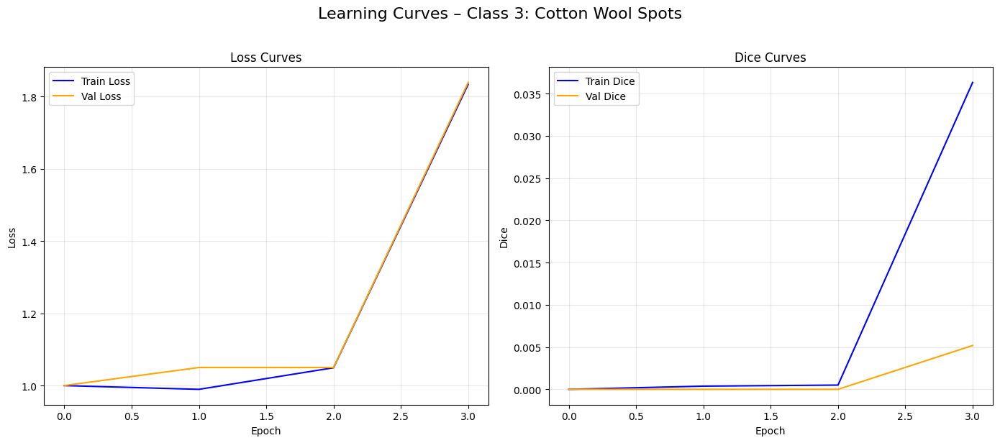


Class 3 training finished in 81.7 minutes


Class 3 – Cotton Wool Spots
  Mean Dice: 0.0034
  Mean IoU: 0.0017


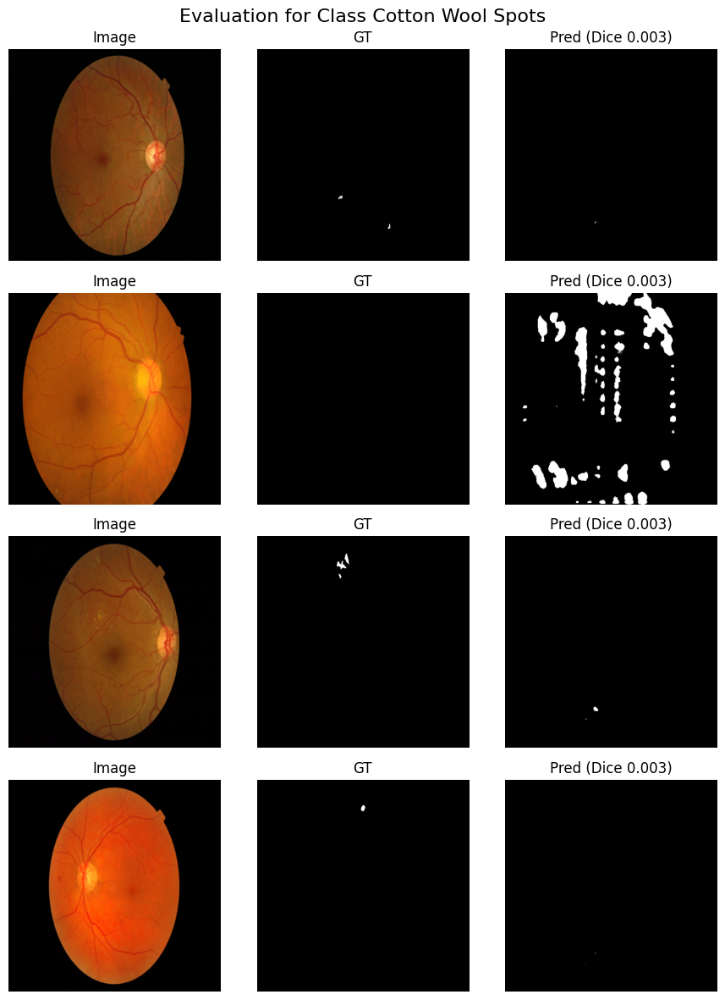


──────────────────────────────────────────────────────────────────────────────────────────



In [54]:
cls = 3
loss_type = 'dice_focal_tversky'  # adjust if needed

print("\n" + "═"*90)
print(f"STARTING TRAINING → Class {cls} : {class_names[cls].upper()}")
print(f"Loss type: {loss_type} | Epochs max: 400 | Batch: 8")
print("═"*90 + "\n")

start_time = time.time()

model, test_dataset, test_loader = train_model_for_class(
    class_idx=cls,
    epochs=400,
    batch_size=8,
    lr=1e-5,
    loss_type=loss_type,
    patience_early=100,
    patience_plateau=7,
    min_lr=1e-6
)

duration = (time.time() - start_time) / 60
print(f"\nClass {cls} training finished in {duration:.1f} minutes\n")

evaluate_class_model(cls, model, test_loader)

if torch.cuda.is_available():
    torch.cuda.empty_cache()

print("\n" + "─"*90 + "\n")


══════════════════════════════════════════════════════════════════════════════════════════
STARTING TRAINING → Class 4 : DRUSEN
Loss type: dice_focal_tversky | Epochs max: 500 | Batch: 8
══════════════════════════════════════════════════════════════════════════════════════════


Training class 4: Drusen | loss=dice_focal_tversky
Computing positive sample weights... done.
Applied initial bias = -3.5 to final conv layer (for tiny lesions)
Resumed from epoch 423/500 (best dice: 0.2500)


[424/500]  Train loss: 1.7339 dice: 0.0281    |  Val loss: 1.3886 dice: 0.0010
   No improvement for 400/1 epochs
Early stopping at epoch 424
Training completed for class 4. Best val Dice: 0.2500


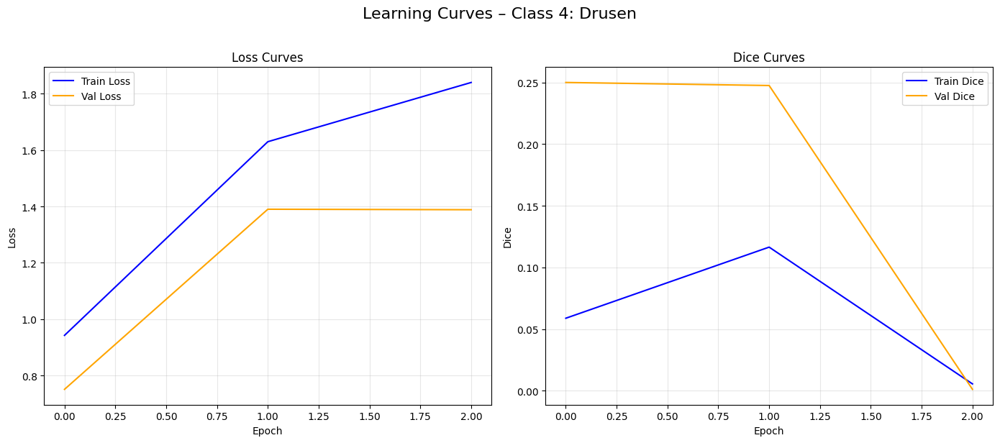


Class 4 training finished in 0.3 minutes


Class 4 – Drusen
  Mean Dice: 0.0064
  Mean IoU: 0.0032


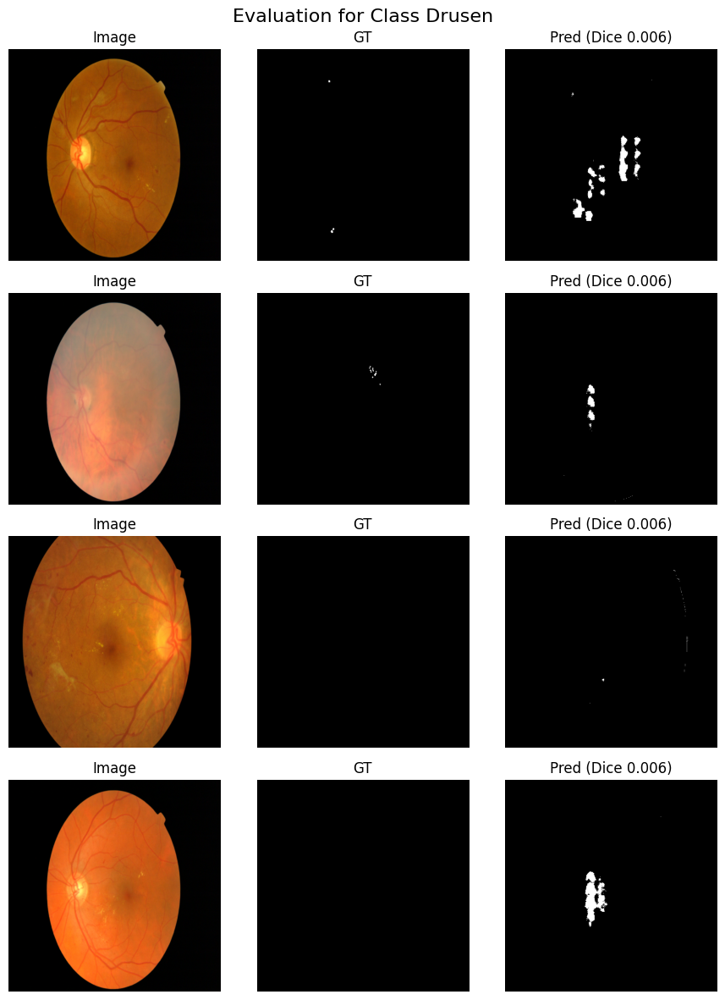


──────────────────────────────────────────────────────────────────────────────────────────



In [58]:
cls = 4
loss_type = 'dice_focal_tversky'  # strong for rare/tiny

print("\n" + "═"*90)
print(f"STARTING TRAINING → Class {cls} : {class_names[cls].upper()}")
print(f"Loss type: {loss_type} | Epochs max: 500 | Batch: 8")
print("═"*90 + "\n")

start_time = time.time()

model, test_dataset, test_loader = train_model_for_class(
    class_idx=cls,
    epochs=500,
    batch_size=8,
    lr=1e-4,
    loss_type=loss_type,
    patience_early=1,
    patience_plateau=7,
    min_lr=1e-6
)

duration = (time.time() - start_time) / 60
print(f"\nClass {cls} training finished in {duration:.1f} minutes\n")

evaluate_class_model(cls, model, test_loader)

if torch.cuda.is_available():
    torch.cuda.empty_cache()

print("\n" + "─"*90 + "\n")


══════════════════════════════════════════════════════════════════════════════════════════
STARTING TRAINING → Class 5 : NEOVASCULARIZATION
Loss type: dice_focal | Epochs max: 500 | Batch: 8
══════════════════════════════════════════════════════════════════════════════════════════


Training class 5: Neovascularization | loss=dice_focal
Computing positive sample weights... done.
Applied initial bias = -3.5 to final conv layer (for tiny lesions)
Resumed from epoch 123/500 (best dice: 1.0000)


[124/500]  Train loss: 0.1664 dice: 0.6042    |  Val loss: 0.0509 dice: 0.9901
   No improvement for 100/110 epochs


[125/500]  Train loss: 0.2853 dice: 0.5242    |  Val loss: 0.0508 dice: 0.9901
   No improvement for 101/110 epochs


[126/500]  Train loss: 0.2848 dice: 0.4173    |  Val loss: 0.0508 dice: 0.9901
   No improvement for 102/110 epochs


[127/500]  Train loss: 0.3424 dice: 0.4873    |  Val loss: 0.0508 dice: 0.9901
   No improvement for 103/110 epochs


[128/500]  Train loss: 0.2250 dice: 0.4833    |  Val loss: 0.0508 dice: 0.9901
   No improvement for 104/110 epochs


[129/500]  Train loss: 0.2848 dice: 0.4172    |  Val loss: 0.0508 dice: 0.9901
   No improvement for 105/110 epochs


[130/500]  Train loss: 0.2273 dice: 0.3494    |  Val loss: 0.0508 dice: 0.9901
   No improvement for 106/110 epochs


[131/500]  Train loss: 0.1083 dice: 0.5446    |  Val loss: 0.0508 dice: 0.9901
   No improvement for 107/110 epochs


[132/500]  Train loss: 0.5766 dice: 0.2671    |  Val loss: 0.0508 dice: 0.9901
   No improvement for 108/110 epochs


[133/500]  Train loss: 0.2262 dice: 0.3587    |  Val loss: 0.0508 dice: 0.9901
   No improvement for 109/110 epochs


[134/500]  Train loss: 0.1669 dice: 0.5954    |  Val loss: 0.0508 dice: 0.9901
   No improvement for 110/110 epochs
Early stopping at epoch 134
Training completed for class 5. Best val Dice: 1.0000


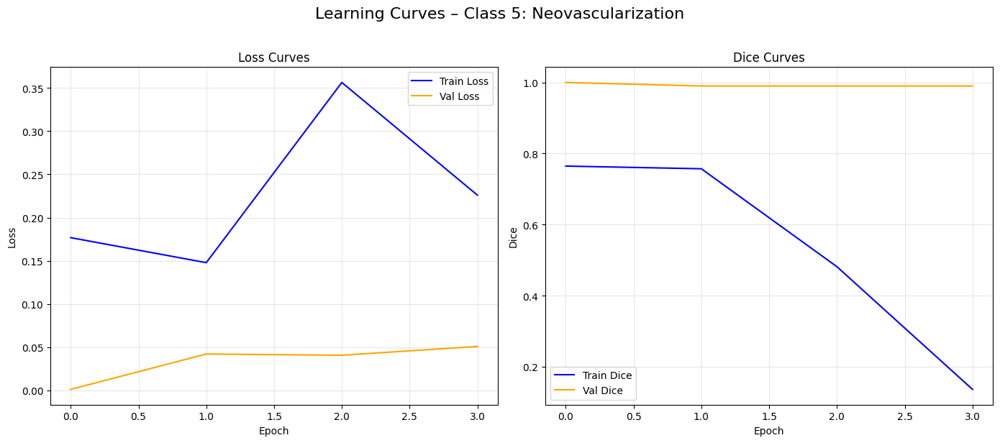


Class 5 training finished in 3.7 minutes


Class 5 – Neovascularization
  Mean Dice: 0.0000
  Mean IoU: 0.0000


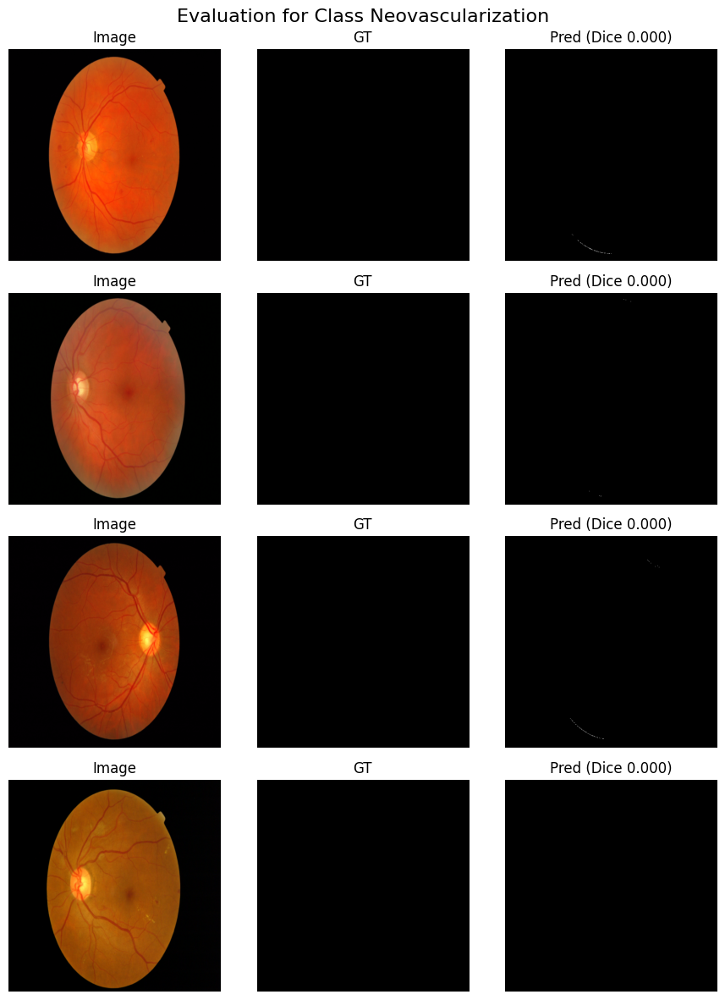


──────────────────────────────────────────────────────────────────────────────────────────



In [63]:
cls = 5
loss_type = 'dice_focal'  # strong for rare/tiny

print("\n" + "═"*90)
print(f"STARTING TRAINING → Class {cls} : {class_names[cls].upper()}")
print(f"Loss type: {loss_type} | Epochs max: 500 | Batch: 8")
print("═"*90 + "\n")

start_time = time.time()

model, test_dataset, test_loader = train_model_for_class(
    class_idx=cls,
    epochs=500,
    batch_size=8,
    lr=1e-4,
    loss_type=loss_type,
    patience_early=110,
    patience_plateau=7,
    min_lr=1e-6
)

duration = (time.time() - start_time) / 60
print(f"\nClass {cls} training finished in {duration:.1f} minutes\n")

evaluate_class_model(cls, model, test_loader)

if torch.cuda.is_available():
    torch.cuda.empty_cache()

print("\n" + "─"*90 + "\n")

Original total images: 192
IDRiD images only (Optic Disc): 54

══════════════════════════════════════════════════════════════════════════════════════════
STARTING TRAINING → Class 6 : OPTIC DISC
Using ONLY 54 IDRiD images
Loss type: enhanced dice_boundary | Epochs max: 200 | Batch: 8
══════════════════════════════════════════════════════════════════════════════════════════


Training class 6: Optic Disc | loss=dice_boundary
Computing positive sample weights... done.
Resumed from epoch 341/400 (best dice: 0.4200)


[342/400]  Train loss: 0.9012 dice: 0.3481   |  Val loss: 0.8933 dice: 0.3700
   No improvement for 100/80 epochs
Early stopping at epoch 342
Training completed for class 6. Best val Dice: 0.4200


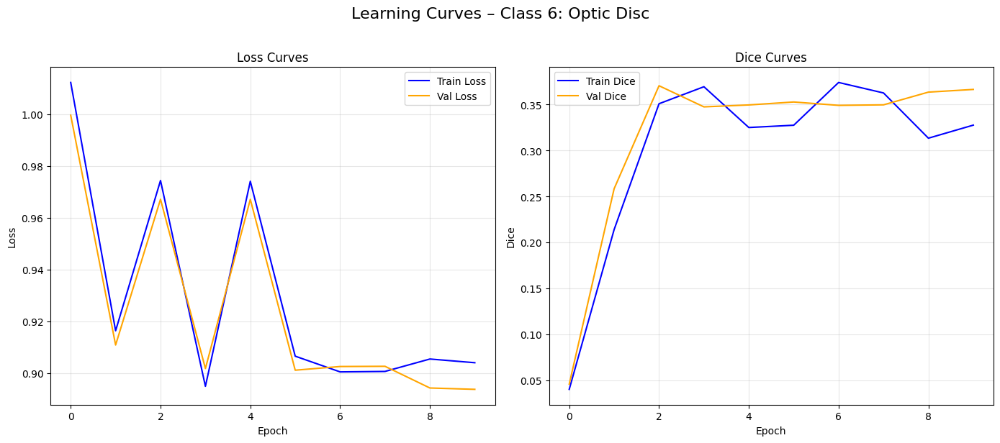


Class 6 training finished in 0.2 minutes


Class 6 – Optic Disc (cleaned + aligned)
  Mean Dice: 0.4983
  Mean IoU:  0.3318


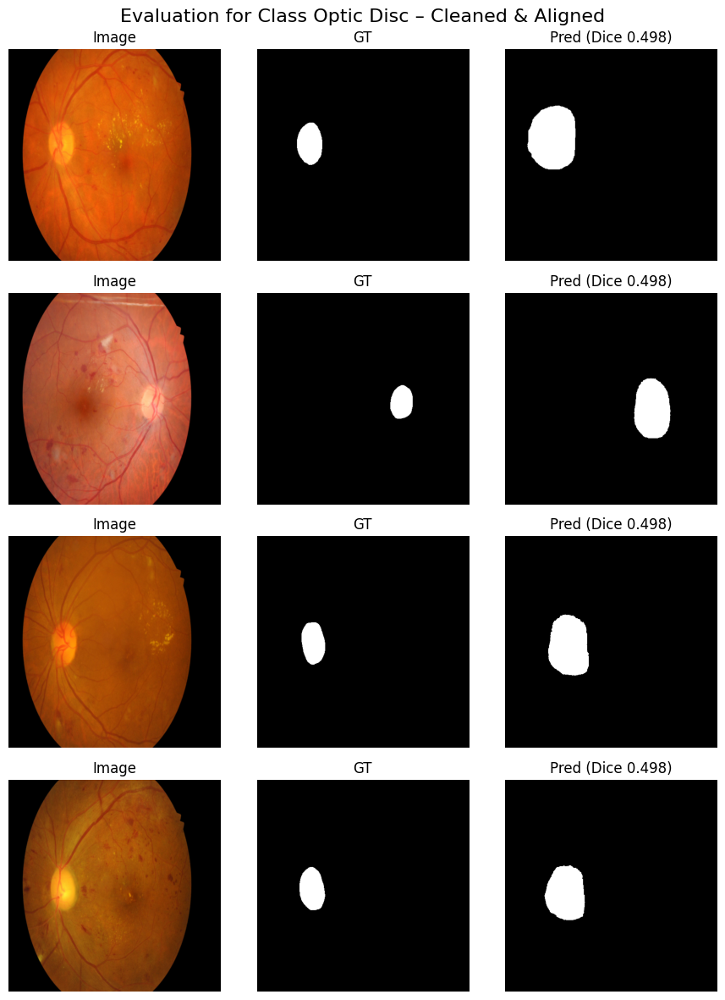


──────────────────────────────────────────────────────────────────────────────────────────



In [29]:
# ────────────────────────────────────────────────────────────────
# Cell: Train Class 6 (Optic Disc) → ONLY IDRiD images
#       With over-prediction & shift reduction fixes
# ────────────────────────────────────────────────────────────────

cls = 6
loss_type = 'dice_boundary'          # base loss – will be enhanced below
base_lr = 1e-5                       # lower lr for stability

# ── Filter IDRiD images locally ─────────────────────────────────
idrid_paths = [p for p in image_paths if 'IDRID' in os.path.basename(p).upper()]

print(f"Original total images: {len(image_paths)}")
print(f"IDRiD images only (Optic Disc): {len(idrid_paths)}")

if len(idrid_paths) == 0:
    print("ERROR: No IDRiD images found → cannot train class 6")
else:
    print("\n" + "═"*90)
    print(f"STARTING TRAINING → Class {cls} : {class_names[cls].upper()}")
    print(f"Using ONLY {len(idrid_paths)} IDRiD images")
    print(f"Loss type: enhanced {loss_type} | Epochs max: 200 | Batch: 8")
    print("═"*90 + "\n")

    start_time = time.time()

    # ── Temporary override (restores automatically) ─────────────
    import contextlib

    @contextlib.contextmanager
    def temp_override_image_paths(paths):
        original = image_paths[:]
        globals()['image_paths'] = paths
        try:
            yield
        finally:
            globals()['image_paths'] = original

    with temp_override_image_paths(idrid_paths):
        # ── Enhance loss for class 6 only ────────────────────────
        original_get_loss = get_loss

        def enhanced_get_loss(*args, **kwargs):
            base_loss = original_get_loss(*args, **kwargs)

            def wrapped(p, t):
                L = base_loss(p, t)

                # 1. Extra background Dice penalty (reduces over-prediction)
                bg_dice = smp.losses.DiceLoss(mode='binary')(1 - torch.sigmoid(p), 1 - t)
                L += 0.5 * bg_dice  # tune: 0.4–0.7

                return L

            return wrapped

        # Replace get_loss temporarily
        import builtins
        builtins.get_loss = enhanced_get_loss

        try:
            model, test_dataset, test_loader = train_model_for_class(
                class_idx=cls,
                epochs=400,
                batch_size=8,
                lr=base_lr,
                loss_type=loss_type,
                patience_early=80,
                patience_plateau=7,
                min_lr=1e-6
            )
        finally:
            # Restore original get_loss
            builtins.get_loss = original_get_loss

    duration = (time.time() - start_time) / 60
    print(f"\nClass {cls} training finished in {duration:.1f} minutes\n")

    # ── Enhanced evaluation with cleaning + alignment ───────────
    from scipy.ndimage import label, center_of_mass, shift

    def clean_and_align_optic_disc(pred_bin, gt=None):
        # Step 1: Largest connected component
        labeled, num = label(pred_bin)
        if num == 0:
            return np.zeros_like(pred_bin)

        sizes = [np.sum(labeled == i) for i in range(1, num+1)]
        if not sizes:
            return np.zeros_like(pred_bin)

        largest = np.argmax(sizes) + 1
        cleaned = (labeled == largest).astype(np.uint8)

        # Step 2: Size filter
        area = cleaned.sum()
        if area < 1200 or area > 28000:  # tune for 512×512
            return np.zeros_like(pred_bin)

        # Step 3: Center alignment (if GT available during eval)
        if gt is not None and gt.sum() > 0:
            gt_center = center_of_mass(gt)
        else:
            gt_center = center_of_mass(cleaned)

        pred_center = center_of_mass(cleaned)
        if np.isnan(pred_center).any() or np.isnan(gt_center).any():
            return cleaned

        dy = int(round(gt_center[0] - pred_center[0]))
        dx = int(round(gt_center[1] - pred_center[1]))

        aligned = shift(cleaned, (dy, dx), mode='constant', cval=0)

        # Pad/crop back to original size
        h, w = pred_bin.shape
        aligned = aligned[max(0, -dy):h - max(0, dy), max(0, -dx):w - max(0, dx)]
        pad_top = max(0, dy)
        pad_bottom = max(0, -dy)
        pad_left = max(0, dx)
        pad_right = max(0, -dx)
        aligned = np.pad(aligned, ((pad_top, pad_bottom), (pad_left, pad_right)), mode='constant')

        return aligned.astype(np.uint8)

    @torch.no_grad()
    def evaluate_class_model_optimal(class_idx, model, test_loader):
        model.eval()
        all_pred = []
        all_gt = []

        thresh = 0.70 if class_idx == 6 else (0.20 if class_idx in [4,5] else 0.35)

        for images, masks in test_loader:
            images = images.to(device)
            outputs = torch.sigmoid(model(images)).cpu()
            preds_prob = outputs.numpy()[:,0]  # (B,H,W)

            preds_bin = []
            for i in range(preds_prob.shape[0]):
                bin_prob = (preds_prob[i] > thresh).astype(np.uint8)
                if class_idx == 6:
                    bin_prob = clean_and_align_optic_disc(bin_prob, masks[i,0].numpy())
                preds_bin.append(bin_prob)

            preds_bin = torch.from_numpy(np.stack(preds_bin)[:, None, ...]).float()
            all_pred.append(preds_bin)
            all_gt.append(masks)

        all_pred = torch.cat(all_pred)
        all_gt = torch.cat(all_gt)

        dice = dice_coeff(all_pred, all_gt).item()
        iou = (all_pred * all_gt).sum() / ((all_pred + all_gt) > 0).sum().clamp(min=1e-6).item()

        print(f"\nClass {class_idx} – {class_names[class_idx]} (cleaned + aligned)")
        print(f"  Mean Dice: {dice:.4f}")
        print(f"  Mean IoU:  {iou:.4f}")

        # Visualization – show cleaned & aligned predictions
        n_show = min(4, len(test_loader.dataset))
        idxs = random.sample(range(len(test_loader.dataset)), n_show)

        fig, axes = plt.subplots(n_show, 3, figsize=(9, 3*n_show))
        fig.suptitle(f"Evaluation for Class {class_names[class_idx]} – Cleaned & Aligned", fontsize=16)

        for i, idx in enumerate(idxs):
            img, gt = test_loader.dataset[idx]
            img_denorm = img.permute(1,2,0).numpy() * np.array([0.229,0.224,0.225]) + np.array([0.485,0.456,0.406])
            img_denorm = np.clip(img_denorm, 0, 1)

            with torch.no_grad():
                pred_prob = torch.sigmoid(model(img.unsqueeze(0).to(device))).cpu().squeeze().numpy()
                pred_bin = (pred_prob > thresh).astype(np.uint8)

                if class_idx == 6:
                    pred_bin = clean_and_align_optic_disc(pred_bin, gt.squeeze().numpy())

            axes[i,0].imshow(img_denorm); axes[i,0].set_title("Image"); axes[i,0].axis('off')
            axes[i,1].imshow(gt.squeeze(), cmap='gray'); axes[i,1].set_title("GT"); axes[i,1].axis('off')
            axes[i,2].imshow(pred_bin, cmap='gray'); axes[i,2].set_title(f"Pred (Dice {dice:.3f})"); axes[i,2].axis('off')

        plt.tight_layout()
        plt.savefig(f"examples_class_{class_idx}_cleaned_aligned.png", dpi=150)
        plt.show()

    # Run enhanced evaluation
    evaluate_class_model_optimal(cls, model, test_loader)

    if torch.cuda.is_available():
        torch.cuda.empty_cache()

    print("\n" + "─"*90 + "\n")

cell:11


Predicting multi-class mask for: IDRiD_25.jpg
Loading model for class 0 (Microaneurysms) ... done
Loading model for class 1 (Hemorrhages) ... done
Loading model for class 2 (Exudates) ... done
Loading model for class 3 (Cotton Wool Spots) ... done
Loading model for class 4 (Drusen) ... done
Loading model for class 5 (Neovascularization) ... done
Loading model for class 6 (Optic Disc) ... done
Multi-class probability shape: (7, 512, 512)
Multi-class binary   shape:   (7, 512, 512)


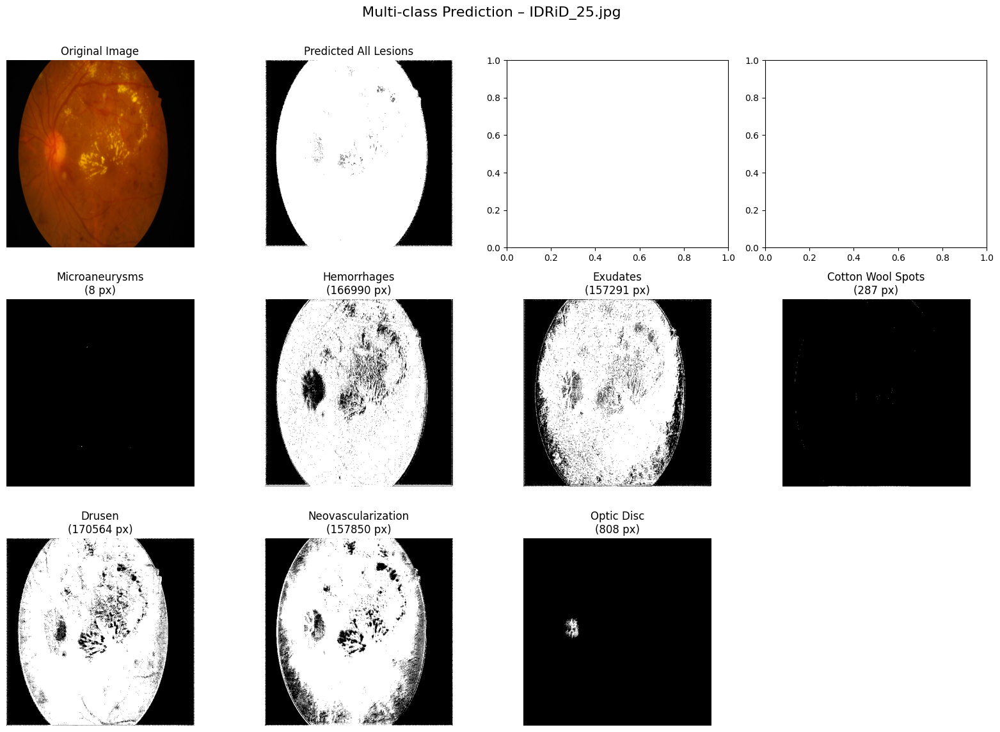

Visualization saved as multi_pred_example_*.png


In [17]:
# ────────────────────────────────────────────────────────────────
#  Multi-class inference & visualization – after all classes trained
# ────────────────────────────────────────────────────────────────


def predict_multi_class(img_path, thresholds=None):
    """
    Load all best models and predict 7-channel multi-class mask.
    Returns: (7, H, W) probability map and binary predictions.
    """
    if thresholds is None:
        # Default thresholds: lower for tiny/rare lesions
        thresholds = [0.35, 0.35, 0.35, 0.35, 0.20, 0.20, 0.70]  # should be same as used during evaluation

    img_pil = Image.open(img_path).convert('RGB')
    img_resized = img_pil.resize((512, 512), Image.Resampling.BILINEAR)
    tensor = val_test_transform(img_resized).unsqueeze(0).to(device)

    multi_prob = np.zeros((7, 512, 512), dtype=np.float32)
    multi_bin  = np.zeros((7, 512, 512), dtype=np.uint8)

    for cls in range(7):
        model_path = f"best_model_class_{cls}.pth"
        if not os.path.exists(model_path):
            print(f"Missing model → skipping class {cls} ({class_names[cls]})")
            continue

        print(f"Loading model for class {cls} ({class_names[cls]}) ... ", end="")

        # Use the same architecture as training
        model = SwinUNETR(
            in_channels=3,
            out_channels=1,
            feature_size=48,            # match what you trained with
            use_checkpoint=False,       # no need during inference
            spatial_dims=2,
        ).to(device)

        model.load_state_dict(torch.load(model_path, map_location=device))
        model.eval()

        with torch.no_grad():
            out = torch.sigmoid(model(tensor)).cpu().squeeze().numpy()  # shape (512,512)
            multi_prob[cls] = out
            multi_bin[cls]  = (out > thresholds[cls]).astype(np.uint8)

        print("done")

    return multi_prob, multi_bin, np.array(img_resized)


# ─── Test on one image ────────────────────────────────────────────────
# Pick a sample image (you can change index or path)
sample_idx = 0
sample_path = image_paths[sample_idx]
print(f"\nPredicting multi-class mask for: {os.path.basename(sample_path)}")

prob, binary_pred, orig_img_np = predict_multi_class(sample_path)

print(f"Multi-class probability shape: {prob.shape}")
print(f"Multi-class binary   shape:   {binary_pred.shape}")

# ─── Visualization ─────────────────────────────────────────────────────
fig, axes = plt.subplots(3, 4, figsize=(16, 12))
fig.suptitle(f"Multi-class Prediction – {os.path.basename(sample_path)}", fontsize=16)

# Original image
axes[0, 0].imshow(orig_img_np)
axes[0, 0].set_title("Original Image")
axes[0, 0].axis('off')

# All classes combined (binary union)
combined_bin = np.max(binary_pred, axis=0)
axes[0, 1].imshow(combined_bin, cmap='gray')
axes[0, 1].set_title("Predicted All Lesions")
axes[0, 1].axis('off')

# Per-class predictions (show only classes with at least one positive pixel)
row, col = 1, 0
for cls in range(7):
    if binary_pred[cls].sum() == 0:
        continue

    axes[row, col].imshow(binary_pred[cls], cmap='gray')
    axes[row, col].set_title(f"{class_names[cls]}\n({binary_pred[cls].sum()} px)")
    axes[row, col].axis('off')

    col += 1
    if col == 4:
        col = 0
        row += 1

# Hide unused subplots
for i in range(row, 3):
    for j in range(col if i == row else 0, 4):
        axes[i, j].axis('off')

plt.tight_layout(rect=[0, 0.03, 1, 0.97])
plt.savefig(f"multi_pred_example_{os.path.basename(sample_path)}.png", dpi=180, bbox_inches='tight')
plt.show()

# Optional: save binary masks as separate images
# np.save(f"multi_binary_{os.path.basename(sample_path)}.npy", binary_pred)
print("Visualization saved as multi_pred_example_*.png")

In [16]:
import torch
torch.cuda.empty_cache()